Google Colab Link: https://colab.research.google.com/drive/1rgIU1JA1s2ekYPbSoyUi9DI9erxPM36y?usp=sharing

Mount Google Drive


In [37]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Import Required Libraries

In [38]:
import numpy as np
from PIL import Image
import random
import os
import sys
import tensorflow as tf
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Input, Lambda, BatchNormalization
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from IPython.display import clear_output

%matplotlib inline

In [39]:
IMAGE_PATH = 'drive/MyDrive/DeepParekh_Assignment3/images'
MASK_PATH = 'drive/MyDrive/DeepParekh_Assignment3/masks'
TEST_PATH = 'drive/MyDrive/DeepParekh_Assignment3/testing_images'

# List of all image paths
image_path_list = [os.path.join(IMAGE_PATH, x) for x in os.listdir(IMAGE_PATH) if x.endswith('.jpg')]
test_x = [os.path.join(TEST_PATH, x) for x in os.listdir(TEST_PATH) if x.endswith('.jpg')]

DATASET_SIZE = len(image_path_list)
print(DATASET_SIZE)

# Splits training dataset into training and validation
train_x, valid_x = train_test_split(image_path_list, test_size = 0.2, random_state = 42)

TRAIN_SIZE = len(train_x)
print(TRAIN_SIZE)

VALID_SIZE = len(valid_x)
print(VALID_SIZE)

TEST_SIZE = len(test_x)
print(TEST_SIZE)

2000
1600
400
927


In [40]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
IMG_SIZE = 128

def data_augmentation(image, mask):
  rand = random.random()
  if rand > 0.66:
    image = tf.image.flip_left_right(image)
    mask = tf.image.flip_left_right(mask)
  if rand < 0.33:
    image = tf.image.flip_up_down(image)
    mask = tf.image.flip_up_down(mask)
  return image, mask

def parse_data(image_path):
  image_content = tf.io.read_file(image_path)
  
  image = tf.image.decode_jpeg(image_content, channels=3)
  
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  image = tf.cast(image, tf.float32) / 255.0

  mask_path = tf.strings.regex_replace(image_path, "images", "masks")
  mask_content = tf.io.read_file(mask_path)
  mask = tf.image.decode_jpeg(mask_content, channels=1)
  mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE))
  mask = tf.cast(mask, tf.float32) / 255.0
  return image, mask

def parse_test_data(image_path):
  image_content = tf.io.read_file(image_path)
  
  image = tf.image.decode_jpeg(image_content, channels=3)
  
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  image = tf.cast(image, tf.float32) / 255.0
  return image

# Use Dataset.map to apply a function to each element of the dataset
train_dataset_imgpaths = tf.data.Dataset.from_tensor_slices((train_x))
train_dataset = train_dataset_imgpaths.map(parse_data, num_parallel_calls=AUTOTUNE)

valid_dataset_imgpaths = tf.data.Dataset.from_tensor_slices((valid_x))
valid_dataset = valid_dataset_imgpaths.map(parse_data, num_parallel_calls=AUTOTUNE)

print(train_dataset)
print(valid_dataset)

'''
# Performs data augmentation on some images and their masks from the dataset
train_dataset = train_dataset.map(data_augmentation, num_parallel_calls=AUTOTUNE)
valid_dataset = valid_dataset.map(data_augmentation, num_parallel_calls=AUTOTUNE)
'''

<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>
<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>


'\n# Performs data augmentation on some images and their masks from the dataset\ntrain_dataset = train_dataset.map(data_augmentation, num_parallel_calls=AUTOTUNE)\nvalid_dataset = valid_dataset.map(data_augmentation, num_parallel_calls=AUTOTUNE)\n'

Dataset Object Configuration for Performance

In [41]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000

train_dataset_batch = train_dataset.cache().shuffle(BUFFER_SIZE).repeat().batch(BATCH_SIZE)
train_dataset_batch = train_dataset_batch.prefetch(buffer_size=AUTOTUNE)

valid_dataset_batch = valid_dataset.cache().repeat().batch(BATCH_SIZE)
valid_dataset_batch = valid_dataset_batch.prefetch(buffer_size=AUTOTUNE)

Visualize images and their true masks

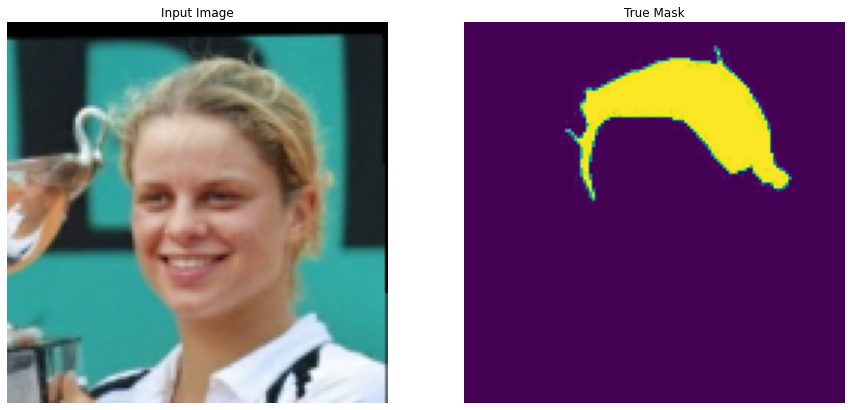

In [42]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    #print(display_list[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')

  plt.show()

for image, mask in train_dataset.take(1):
  sample_image, sample_mask = image, mask
  display([sample_image, sample_mask])

#Dice Loss

In [43]:
def dice_loss(y_true, y_pred):
  print("[dice_loss] y_pred=",y_pred,"y_true=",y_true)
  y_true = tf.cast(y_true, tf.float32)
  numerator = 2 * tf.reduce_sum(y_true * y_pred) # - to maximize dice loss
  denominator = tf.reduce_sum(y_true + y_pred)

  return 1 - numerator / denominator

# U-Net Model

In [44]:
inp = Input((IMG_SIZE, IMG_SIZE, 3))

o1 = Conv2D(16, (3,3), activation = 'relu', kernel_initializer='he_normal', padding='same')(inp)
o1 = Dropout(0.1) (o1)
o1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o1)
p1 = MaxPooling2D((2, 2)) (o1)

o2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
o2 = Dropout(0.2) (o2)
o2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o2)
p2 = MaxPooling2D((2, 2)) (o2)

o3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
o3 = Dropout(0.1) (o3)
o3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o3)
p3 = MaxPooling2D((2, 2)) (o3)

o4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
o4 = Dropout(0.2) (o4)
o4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o4)
p4 = MaxPooling2D(pool_size=(2, 2)) (o4)

o5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
o5 = Dropout(0.2) (o5)
o5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (o5)
u6 = concatenate([u6, o4])
o6 = Conv2D(126, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
o6 = Dropout(0.2) (o6)
o6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (o6)
u7 = concatenate([u7, o3])
o7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
o7 = Dropout(0.2) (o7)
o7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (o7)
u8 = concatenate([u8, o2])
o8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
o8 = Dropout(0.2) (o8)
o8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (o8)
u9 = concatenate([u9, o1], axis=3)
o9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
o9 = Dropout(0.2) (o9)
o9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (o9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (o9)

model = Model(inputs=[inp], outputs=[outputs])
model.summary()

# Compile the model
model.compile(optimizer='adam', loss=dice_loss, metrics=tf.keras.metrics.MeanIoU(num_classes=2))

tf.keras.utils.plot_model(model, show_shapes=True)

# Custom Callback to display predictions
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

def create_mask(pred_mask):
  return pred_mask[0]

def show_predictions(dataset=None, num=2):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    m = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    display([sample_image, sample_mask,m])


Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_57 (Conv2D)              (None, 128, 128, 16) 448         input_4[0][0]                    
__________________________________________________________________________________________________
dropout_27 (Dropout)            (None, 128, 128, 16) 0           conv2d_57[0][0]                  
__________________________________________________________________________________________________
conv2d_58 (Conv2D)              (None, 128, 128, 16) 2320        dropout_27[0][0]                 
_______________________________________________________________________________________

# Train the Model

Epoch 1/100
[dice_loss] y_pred= Tensor("functional_7/conv2d_75/Sigmoid:0", shape=(None, 128, 128, 1), dtype=float32) y_true= Tensor("IteratorGetNext:1", shape=(None, 128, 128, 1), dtype=float32)
[dice_loss] y_pred= Tensor("functional_7/conv2d_75/Sigmoid:0", shape=(None, 128, 128, 1), dtype=float32) y_true= Tensor("IteratorGetNext:1", shape=(None, 128, 128, 1), dtype=float32)
50/50 [==============================] - ETA: 0s - loss: 0.6296 - mean_io_u_3: 0.5276[dice_loss] y_pred= Tensor("functional_7/conv2d_75/Sigmoid:0", shape=(None, 128, 128, 1), dtype=float32) y_true= Tensor("IteratorGetNext:1", shape=(None, 128, 128, 1), dtype=float32)

Epoch 00001: val_loss improved from inf to 0.51624, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


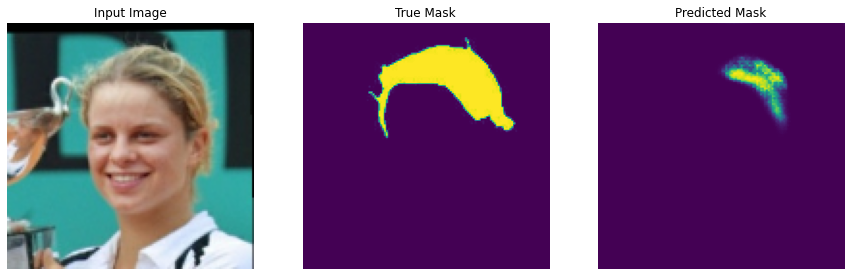


Sample Prediction after epoch 1

50/50 [==============================] - 9s 173ms/step - loss: 0.6296 - mean_io_u_3: 0.5276 - val_loss: 0.5162 - val_mean_io_u_3: 0.4696
Epoch 2/100
50/50 [==============================] - ETA: 0s - loss: 0.4350 - mean_io_u_3: 0.5799
Epoch 00002: val_loss improved from 0.51624 to 0.40669, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


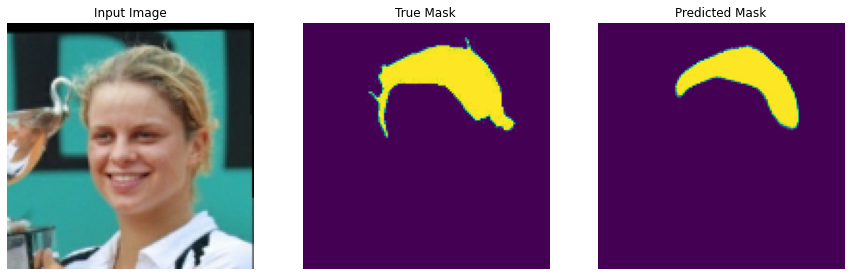


Sample Prediction after epoch 2

50/50 [==============================] - 8s 154ms/step - loss: 0.4350 - mean_io_u_3: 0.5799 - val_loss: 0.4067 - val_mean_io_u_3: 0.5642
Epoch 3/100
50/50 [==============================] - ETA: 0s - loss: 0.3975 - mean_io_u_3: 0.6110
Epoch 00003: val_loss improved from 0.40669 to 0.33295, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


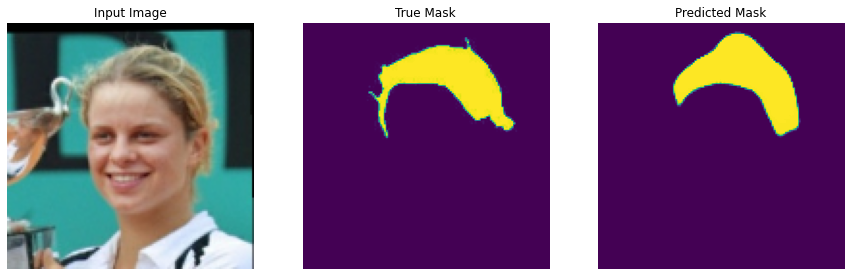


Sample Prediction after epoch 3

50/50 [==============================] - 8s 153ms/step - loss: 0.3975 - mean_io_u_3: 0.6110 - val_loss: 0.3329 - val_mean_io_u_3: 0.6276
Epoch 4/100
50/50 [==============================] - ETA: 0s - loss: 0.3668 - mean_io_u_3: 0.6336
Epoch 00004: val_loss improved from 0.33295 to 0.32295, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


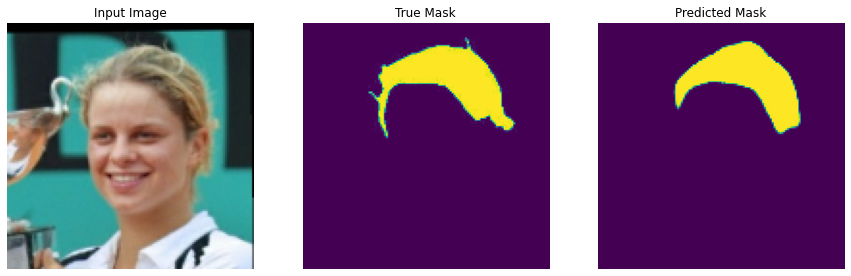


Sample Prediction after epoch 4

50/50 [==============================] - 8s 158ms/step - loss: 0.3668 - mean_io_u_3: 0.6336 - val_loss: 0.3230 - val_mean_io_u_3: 0.6453
Epoch 5/100
50/50 [==============================] - ETA: 0s - loss: 0.3352 - mean_io_u_3: 0.6530
Epoch 00005: val_loss improved from 0.32295 to 0.28956, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


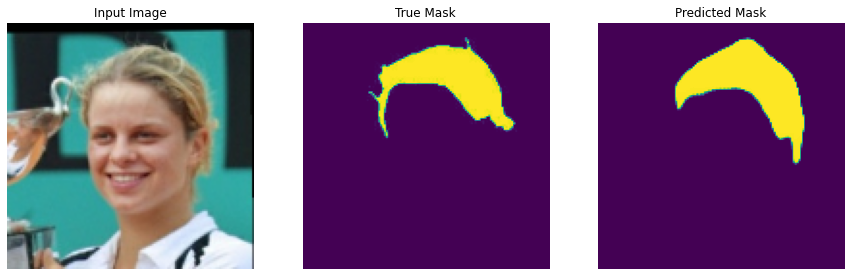


Sample Prediction after epoch 5

50/50 [==============================] - 8s 160ms/step - loss: 0.3352 - mean_io_u_3: 0.6530 - val_loss: 0.2896 - val_mean_io_u_3: 0.6814
Epoch 6/100
50/50 [==============================] - ETA: 0s - loss: 0.3283 - mean_io_u_3: 0.6608
Epoch 00006: val_loss improved from 0.28956 to 0.28866, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


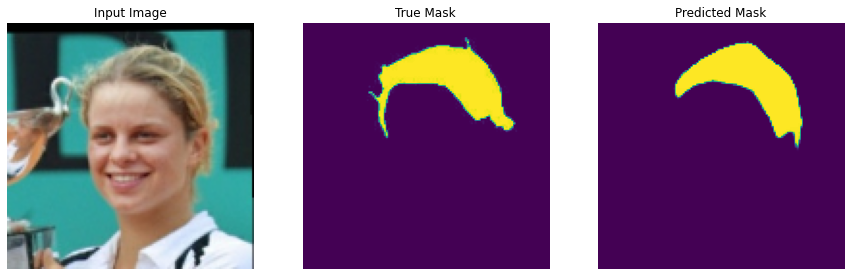


Sample Prediction after epoch 6

50/50 [==============================] - 8s 158ms/step - loss: 0.3283 - mean_io_u_3: 0.6608 - val_loss: 0.2887 - val_mean_io_u_3: 0.6873
Epoch 7/100
50/50 [==============================] - ETA: 0s - loss: 0.3041 - mean_io_u_3: 0.6768
Epoch 00007: val_loss improved from 0.28866 to 0.25664, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


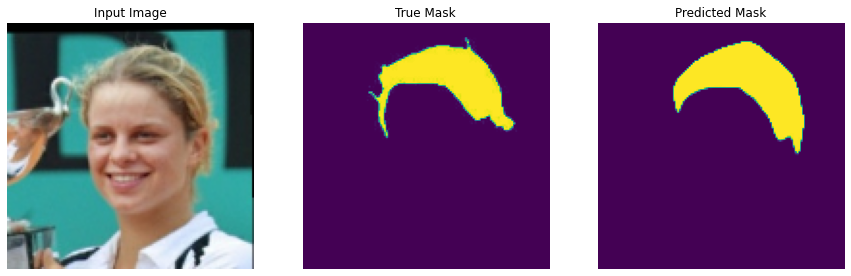


Sample Prediction after epoch 7

50/50 [==============================] - 8s 158ms/step - loss: 0.3041 - mean_io_u_3: 0.6768 - val_loss: 0.2566 - val_mean_io_u_3: 0.7208
Epoch 8/100
50/50 [==============================] - ETA: 0s - loss: 0.2820 - mean_io_u_3: 0.6960
Epoch 00008: val_loss improved from 0.25664 to 0.24916, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


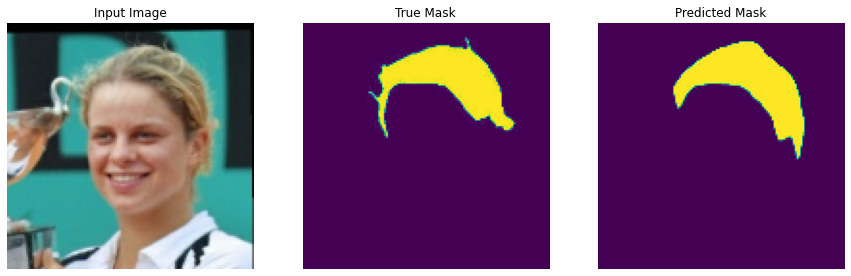


Sample Prediction after epoch 8

50/50 [==============================] - 8s 158ms/step - loss: 0.2820 - mean_io_u_3: 0.6960 - val_loss: 0.2492 - val_mean_io_u_3: 0.7033
Epoch 9/100
50/50 [==============================] - ETA: 0s - loss: 0.2699 - mean_io_u_3: 0.7062
Epoch 00009: val_loss improved from 0.24916 to 0.23114, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


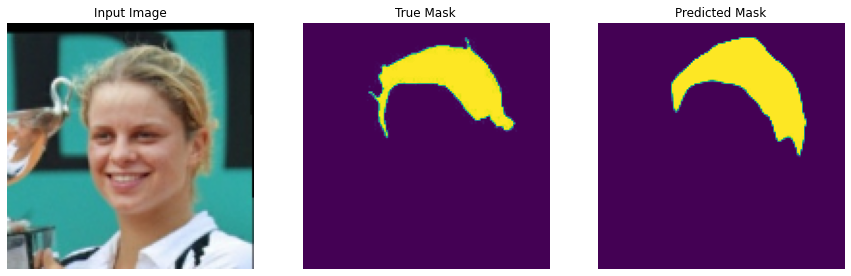


Sample Prediction after epoch 9

50/50 [==============================] - 8s 161ms/step - loss: 0.2699 - mean_io_u_3: 0.7062 - val_loss: 0.2311 - val_mean_io_u_3: 0.7455
Epoch 10/100
50/50 [==============================] - ETA: 0s - loss: 0.2568 - mean_io_u_3: 0.7176
Epoch 00010: val_loss did not improve from 0.23114


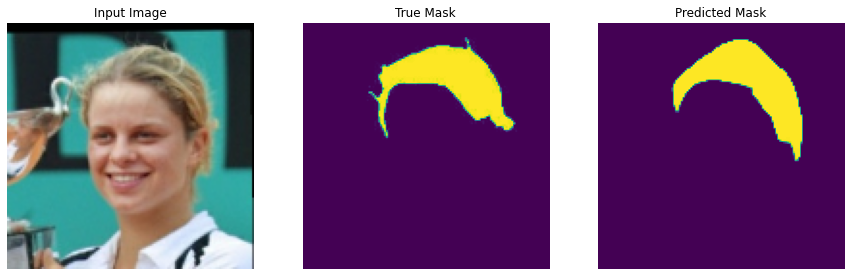


Sample Prediction after epoch 10

50/50 [==============================] - 4s 89ms/step - loss: 0.2568 - mean_io_u_3: 0.7176 - val_loss: 0.2348 - val_mean_io_u_3: 0.7320
Epoch 11/100
50/50 [==============================] - ETA: 0s - loss: 0.2497 - mean_io_u_3: 0.7206
Epoch 00011: val_loss did not improve from 0.23114


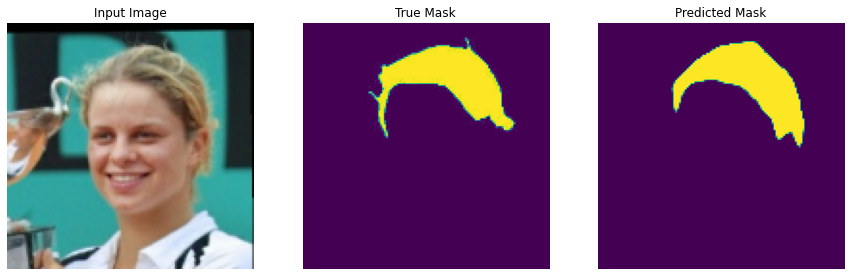


Sample Prediction after epoch 11

50/50 [==============================] - 4s 88ms/step - loss: 0.2497 - mean_io_u_3: 0.7206 - val_loss: 0.2489 - val_mean_io_u_3: 0.7407
Epoch 12/100
50/50 [==============================] - ETA: 0s - loss: 0.2287 - mean_io_u_3: 0.7365
Epoch 00012: val_loss improved from 0.23114 to 0.22282, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


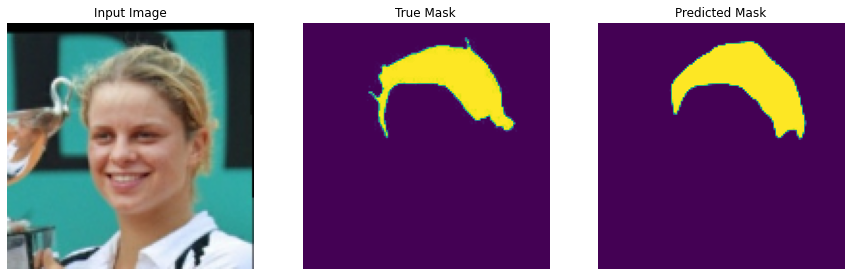


Sample Prediction after epoch 12

50/50 [==============================] - 8s 158ms/step - loss: 0.2287 - mean_io_u_3: 0.7365 - val_loss: 0.2228 - val_mean_io_u_3: 0.7473
Epoch 13/100
50/50 [==============================] - ETA: 0s - loss: 0.2248 - mean_io_u_3: 0.7378
Epoch 00013: val_loss improved from 0.22282 to 0.18804, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


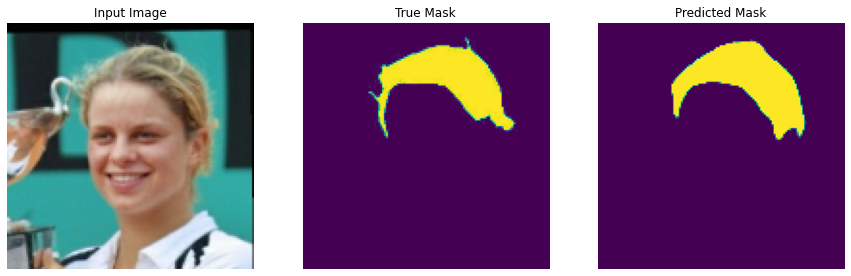


Sample Prediction after epoch 13

50/50 [==============================] - 8s 158ms/step - loss: 0.2248 - mean_io_u_3: 0.7378 - val_loss: 0.1880 - val_mean_io_u_3: 0.7663
Epoch 14/100
50/50 [==============================] - ETA: 0s - loss: 0.2035 - mean_io_u_3: 0.7567
Epoch 00014: val_loss improved from 0.18804 to 0.18607, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


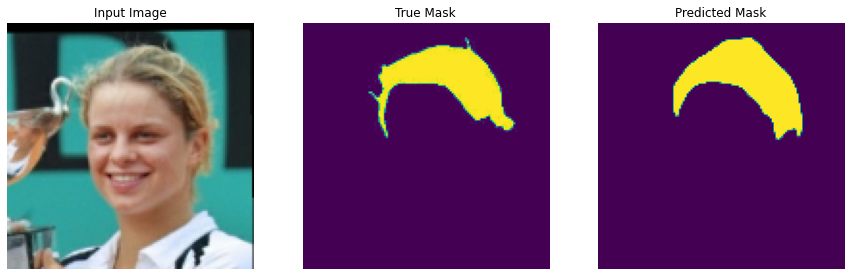


Sample Prediction after epoch 14

50/50 [==============================] - 8s 155ms/step - loss: 0.2035 - mean_io_u_3: 0.7567 - val_loss: 0.1861 - val_mean_io_u_3: 0.7732
Epoch 15/100
50/50 [==============================] - ETA: 0s - loss: 0.1987 - mean_io_u_3: 0.7573
Epoch 00015: val_loss improved from 0.18607 to 0.16410, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


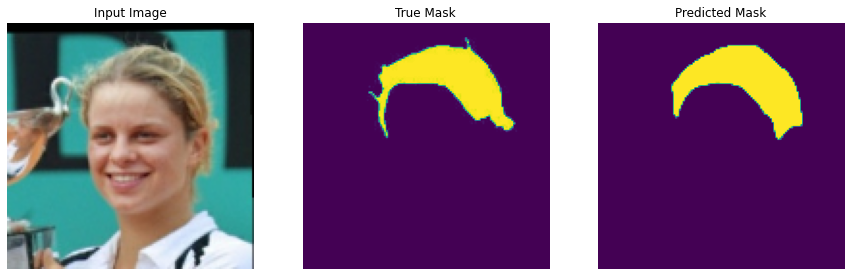


Sample Prediction after epoch 15

50/50 [==============================] - 8s 158ms/step - loss: 0.1987 - mean_io_u_3: 0.7573 - val_loss: 0.1641 - val_mean_io_u_3: 0.7850
Epoch 16/100
50/50 [==============================] - ETA: 0s - loss: 0.2021 - mean_io_u_3: 0.7550
Epoch 00016: val_loss did not improve from 0.16410


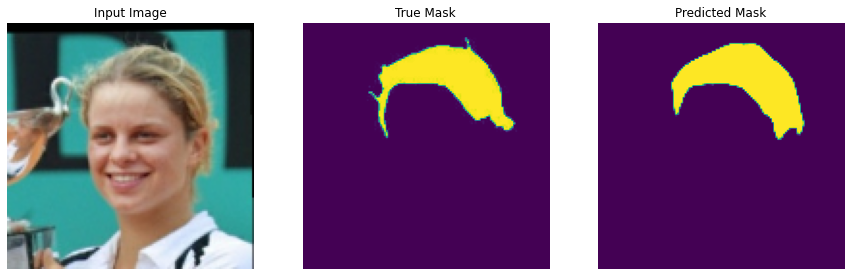


Sample Prediction after epoch 16

50/50 [==============================] - 4s 89ms/step - loss: 0.2021 - mean_io_u_3: 0.7550 - val_loss: 0.2007 - val_mean_io_u_3: 0.7592
Epoch 17/100
50/50 [==============================] - ETA: 0s - loss: 0.1847 - mean_io_u_3: 0.7674
Epoch 00017: val_loss did not improve from 0.16410


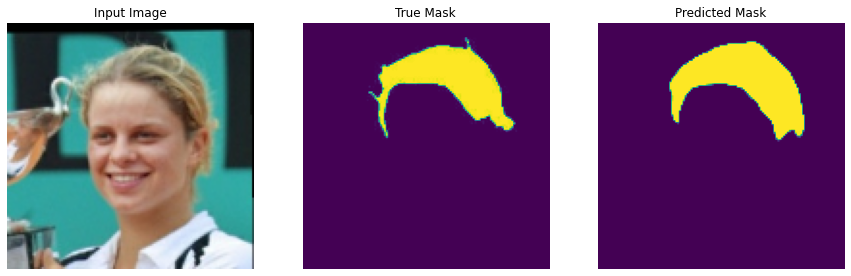


Sample Prediction after epoch 17

50/50 [==============================] - 4s 88ms/step - loss: 0.1847 - mean_io_u_3: 0.7674 - val_loss: 0.1872 - val_mean_io_u_3: 0.7532
Epoch 18/100
50/50 [==============================] - ETA: 0s - loss: 0.1774 - mean_io_u_3: 0.7719
Epoch 00018: val_loss did not improve from 0.16410


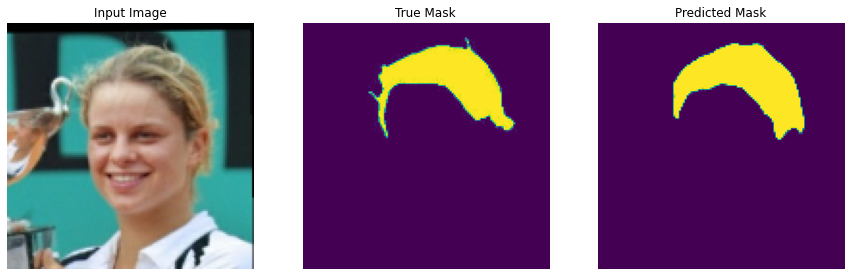


Sample Prediction after epoch 18

50/50 [==============================] - 5s 92ms/step - loss: 0.1774 - mean_io_u_3: 0.7719 - val_loss: 0.1836 - val_mean_io_u_3: 0.7664
Epoch 19/100
50/50 [==============================] - ETA: 0s - loss: 0.1724 - mean_io_u_3: 0.7748
Epoch 00019: val_loss did not improve from 0.16410


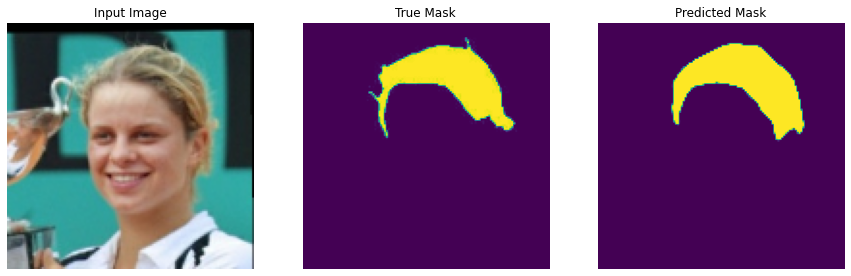


Sample Prediction after epoch 19

50/50 [==============================] - 4s 88ms/step - loss: 0.1724 - mean_io_u_3: 0.7748 - val_loss: 0.1924 - val_mean_io_u_3: 0.7502
Epoch 20/100
50/50 [==============================] - ETA: 0s - loss: 0.1704 - mean_io_u_3: 0.7749
Epoch 00020: val_loss did not improve from 0.16410


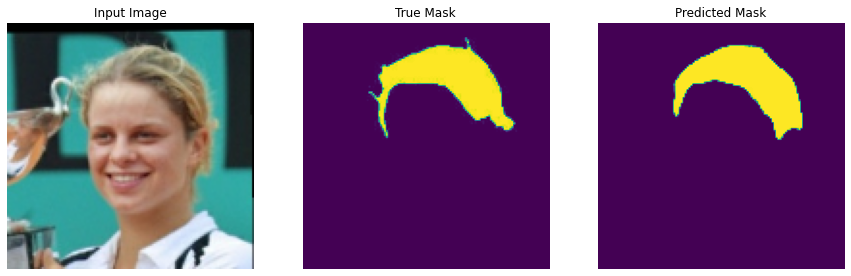


Sample Prediction after epoch 20

50/50 [==============================] - 4s 88ms/step - loss: 0.1704 - mean_io_u_3: 0.7749 - val_loss: 0.1842 - val_mean_io_u_3: 0.7767
Epoch 21/100
50/50 [==============================] - ETA: 0s - loss: 0.1712 - mean_io_u_3: 0.7743
Epoch 00021: val_loss did not improve from 0.16410


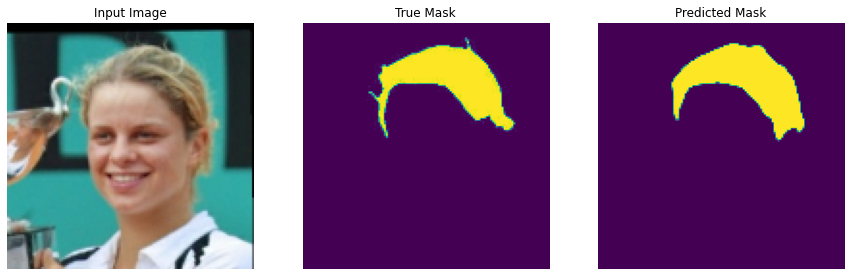


Sample Prediction after epoch 21

50/50 [==============================] - 4s 88ms/step - loss: 0.1712 - mean_io_u_3: 0.7743 - val_loss: 0.1739 - val_mean_io_u_3: 0.7743
Epoch 22/100
50/50 [==============================] - ETA: 0s - loss: 0.1726 - mean_io_u_3: 0.7732
Epoch 00022: val_loss did not improve from 0.16410


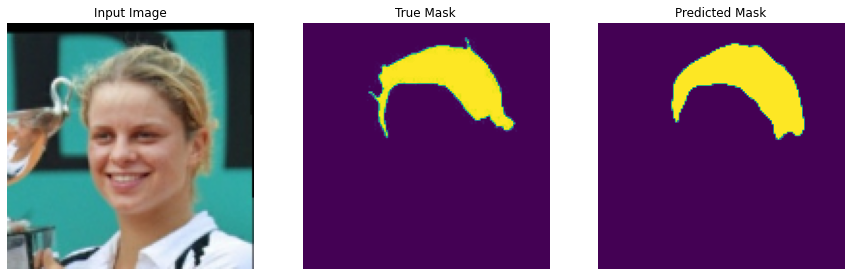


Sample Prediction after epoch 22

50/50 [==============================] - 4s 88ms/step - loss: 0.1726 - mean_io_u_3: 0.7732 - val_loss: 0.1881 - val_mean_io_u_3: 0.7591
Epoch 23/100
50/50 [==============================] - ETA: 0s - loss: 0.1567 - mean_io_u_3: 0.7832
Epoch 00023: val_loss did not improve from 0.16410


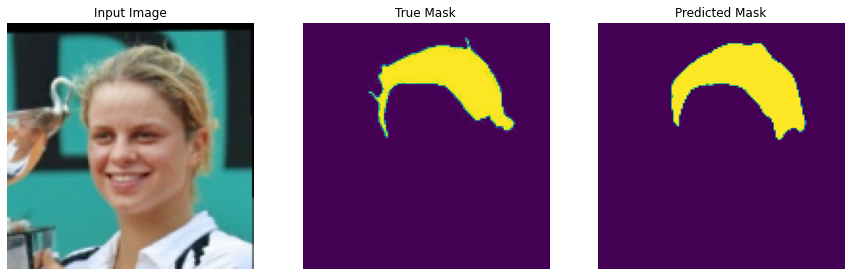


Sample Prediction after epoch 23

50/50 [==============================] - 4s 88ms/step - loss: 0.1567 - mean_io_u_3: 0.7832 - val_loss: 0.1739 - val_mean_io_u_3: 0.7634
Epoch 24/100
50/50 [==============================] - ETA: 0s - loss: 0.1473 - mean_io_u_3: 0.7890
Epoch 00024: val_loss did not improve from 0.16410


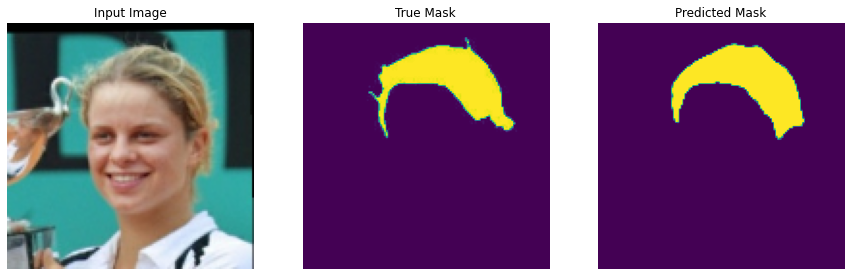


Sample Prediction after epoch 24

50/50 [==============================] - 4s 87ms/step - loss: 0.1473 - mean_io_u_3: 0.7890 - val_loss: 0.1756 - val_mean_io_u_3: 0.7770
Epoch 25/100
50/50 [==============================] - ETA: 0s - loss: 0.1414 - mean_io_u_3: 0.7925
Epoch 00025: val_loss did not improve from 0.16410


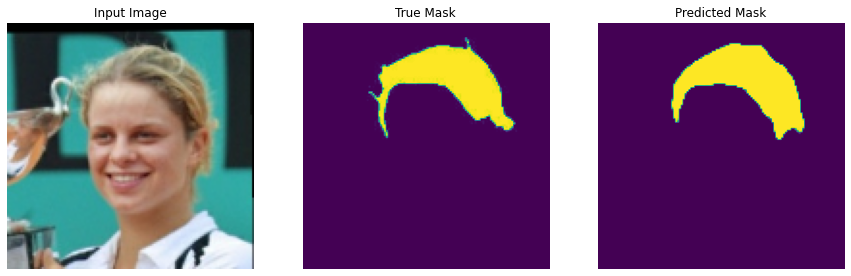


Sample Prediction after epoch 25

50/50 [==============================] - 4s 88ms/step - loss: 0.1414 - mean_io_u_3: 0.7925 - val_loss: 0.1704 - val_mean_io_u_3: 0.7680
Epoch 26/100
50/50 [==============================] - ETA: 0s - loss: 0.1398 - mean_io_u_3: 0.7946
Epoch 00026: val_loss did not improve from 0.16410


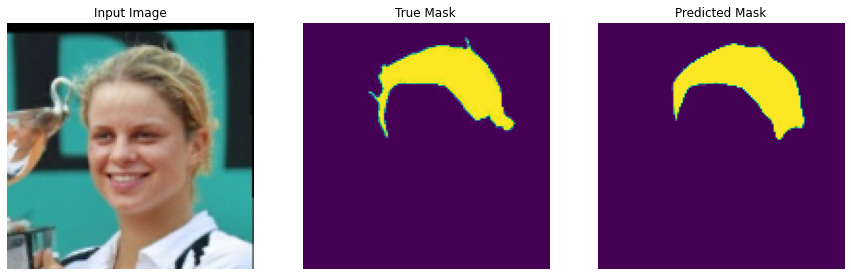


Sample Prediction after epoch 26

50/50 [==============================] - 4s 87ms/step - loss: 0.1398 - mean_io_u_3: 0.7946 - val_loss: 0.1642 - val_mean_io_u_3: 0.7736
Epoch 27/100
50/50 [==============================] - ETA: 0s - loss: 0.1381 - mean_io_u_3: 0.7929
Epoch 00027: val_loss did not improve from 0.16410


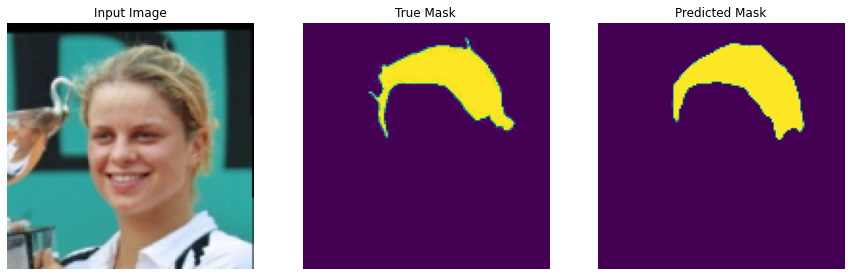


Sample Prediction after epoch 27

50/50 [==============================] - 4s 87ms/step - loss: 0.1381 - mean_io_u_3: 0.7929 - val_loss: 0.1744 - val_mean_io_u_3: 0.7778
Epoch 28/100
50/50 [==============================] - ETA: 0s - loss: 0.1331 - mean_io_u_3: 0.7967
Epoch 00028: val_loss improved from 0.16410 to 0.15489, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


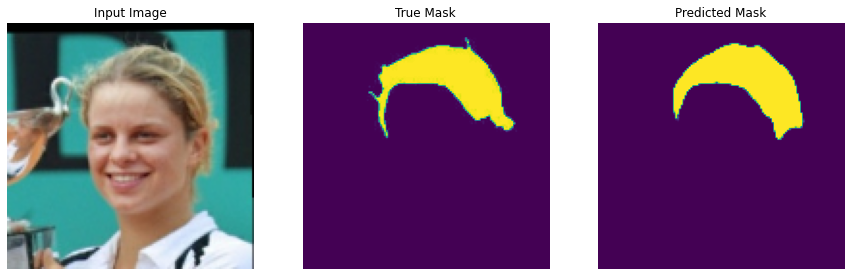


Sample Prediction after epoch 28

50/50 [==============================] - 8s 154ms/step - loss: 0.1331 - mean_io_u_3: 0.7967 - val_loss: 0.1549 - val_mean_io_u_3: 0.7830
Epoch 29/100
50/50 [==============================] - ETA: 0s - loss: 0.1344 - mean_io_u_3: 0.7947
Epoch 00029: val_loss did not improve from 0.15489


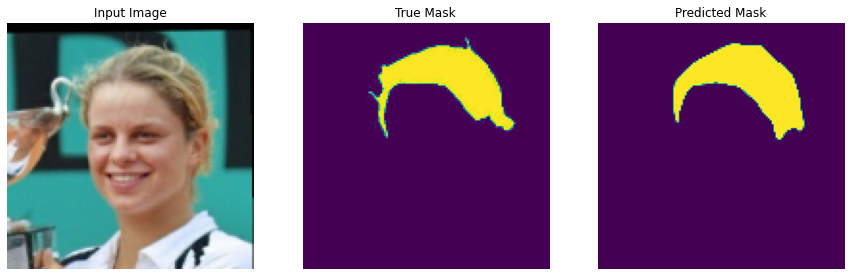


Sample Prediction after epoch 29

50/50 [==============================] - 4s 88ms/step - loss: 0.1344 - mean_io_u_3: 0.7947 - val_loss: 0.1662 - val_mean_io_u_3: 0.7661
Epoch 30/100
50/50 [==============================] - ETA: 0s - loss: 0.1295 - mean_io_u_3: 0.7987
Epoch 00030: val_loss did not improve from 0.15489


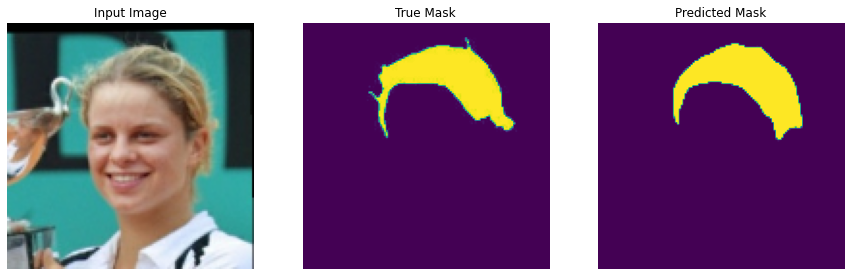


Sample Prediction after epoch 30

50/50 [==============================] - 4s 87ms/step - loss: 0.1295 - mean_io_u_3: 0.7987 - val_loss: 0.1610 - val_mean_io_u_3: 0.7814
Epoch 31/100
50/50 [==============================] - ETA: 0s - loss: 0.1336 - mean_io_u_3: 0.7952
Epoch 00031: val_loss did not improve from 0.15489


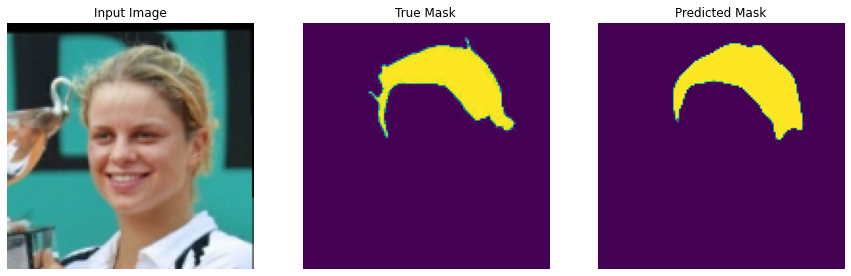


Sample Prediction after epoch 31

50/50 [==============================] - 4s 86ms/step - loss: 0.1336 - mean_io_u_3: 0.7952 - val_loss: 0.1673 - val_mean_io_u_3: 0.7704
Epoch 32/100
50/50 [==============================] - ETA: 0s - loss: 0.1277 - mean_io_u_3: 0.7984
Epoch 00032: val_loss did not improve from 0.15489


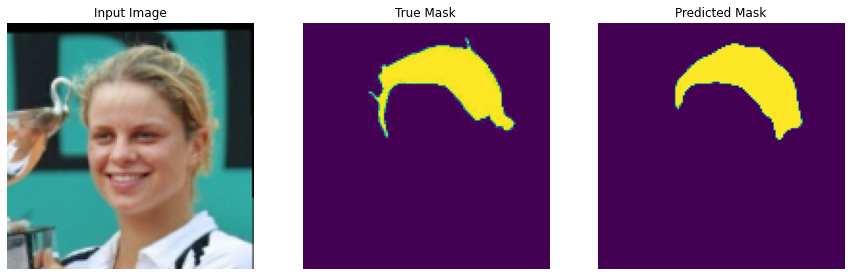


Sample Prediction after epoch 32

50/50 [==============================] - 4s 87ms/step - loss: 0.1277 - mean_io_u_3: 0.7984 - val_loss: 0.1576 - val_mean_io_u_3: 0.7948
Epoch 33/100
50/50 [==============================] - ETA: 0s - loss: 0.1242 - mean_io_u_3: 0.8004
Epoch 00033: val_loss did not improve from 0.15489


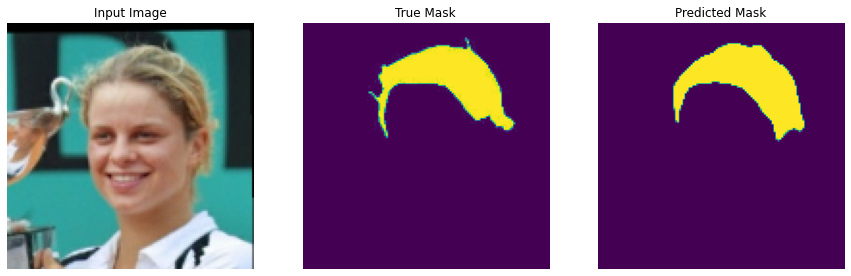


Sample Prediction after epoch 33

50/50 [==============================] - 4s 88ms/step - loss: 0.1242 - mean_io_u_3: 0.8004 - val_loss: 0.1710 - val_mean_io_u_3: 0.7601
Epoch 34/100
50/50 [==============================] - ETA: 0s - loss: 0.1319 - mean_io_u_3: 0.7944
Epoch 00034: val_loss did not improve from 0.15489


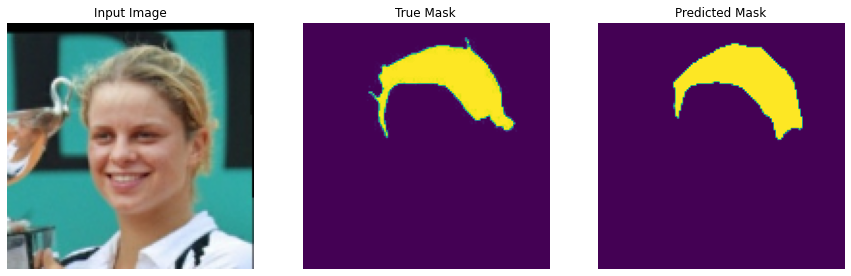


Sample Prediction after epoch 34

50/50 [==============================] - 4s 88ms/step - loss: 0.1319 - mean_io_u_3: 0.7944 - val_loss: 0.1655 - val_mean_io_u_3: 0.7594
Epoch 35/100
50/50 [==============================] - ETA: 0s - loss: 0.1286 - mean_io_u_3: 0.7960
Epoch 00035: val_loss did not improve from 0.15489


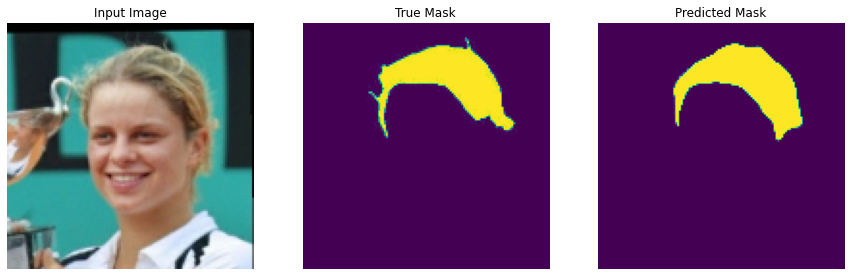


Sample Prediction after epoch 35

50/50 [==============================] - 4s 88ms/step - loss: 0.1286 - mean_io_u_3: 0.7960 - val_loss: 0.1719 - val_mean_io_u_3: 0.7672
Epoch 36/100
50/50 [==============================] - ETA: 0s - loss: 0.1235 - mean_io_u_3: 0.7996
Epoch 00036: val_loss did not improve from 0.15489


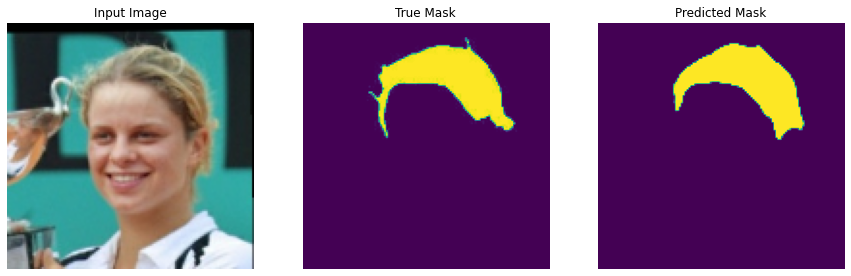


Sample Prediction after epoch 36

50/50 [==============================] - 4s 88ms/step - loss: 0.1235 - mean_io_u_3: 0.7996 - val_loss: 0.1585 - val_mean_io_u_3: 0.7806
Epoch 37/100
50/50 [==============================] - ETA: 0s - loss: 0.1308 - mean_io_u_3: 0.7934
Epoch 00037: val_loss improved from 0.15489 to 0.15457, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


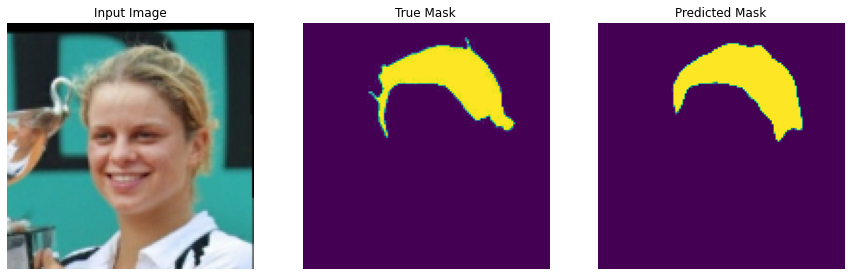


Sample Prediction after epoch 37

50/50 [==============================] - 8s 155ms/step - loss: 0.1308 - mean_io_u_3: 0.7934 - val_loss: 0.1546 - val_mean_io_u_3: 0.7685
Epoch 38/100
50/50 [==============================] - ETA: 0s - loss: 0.1228 - mean_io_u_3: 0.7965
Epoch 00038: val_loss improved from 0.15457 to 0.14168, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


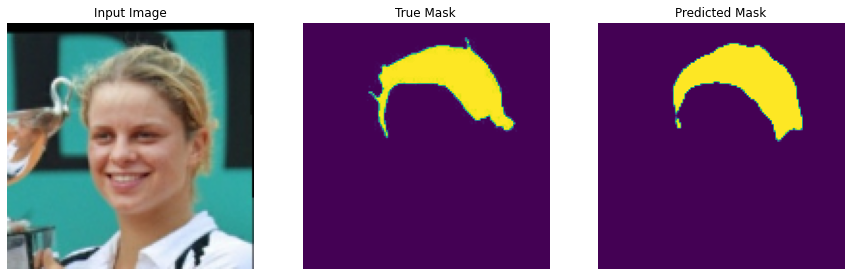


Sample Prediction after epoch 38

50/50 [==============================] - 8s 155ms/step - loss: 0.1228 - mean_io_u_3: 0.7965 - val_loss: 0.1417 - val_mean_io_u_3: 0.7809
Epoch 39/100
50/50 [==============================] - ETA: 0s - loss: 0.1172 - mean_io_u_3: 0.8023
Epoch 00039: val_loss did not improve from 0.14168


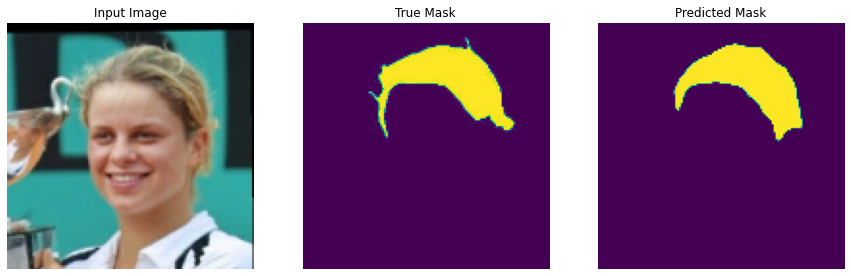


Sample Prediction after epoch 39

50/50 [==============================] - 4s 87ms/step - loss: 0.1172 - mean_io_u_3: 0.8023 - val_loss: 0.1638 - val_mean_io_u_3: 0.7719
Epoch 40/100
50/50 [==============================] - ETA: 0s - loss: 0.1262 - mean_io_u_3: 0.7972
Epoch 00040: val_loss did not improve from 0.14168


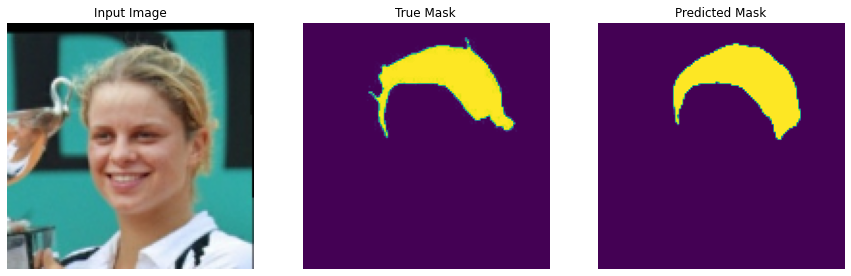


Sample Prediction after epoch 40

50/50 [==============================] - 4s 87ms/step - loss: 0.1262 - mean_io_u_3: 0.7972 - val_loss: 0.1477 - val_mean_io_u_3: 0.7781
Epoch 41/100
50/50 [==============================] - ETA: 0s - loss: 0.1194 - mean_io_u_3: 0.8008
Epoch 00041: val_loss did not improve from 0.14168


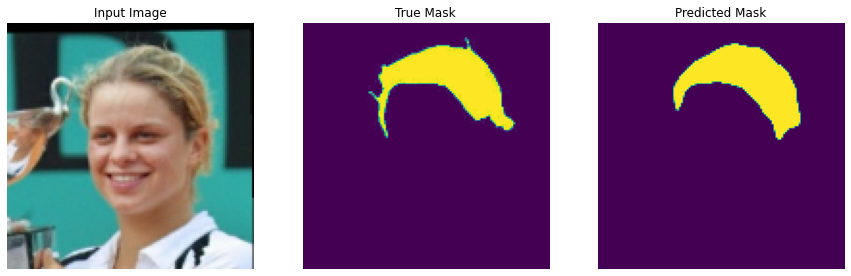


Sample Prediction after epoch 41

50/50 [==============================] - 5s 91ms/step - loss: 0.1194 - mean_io_u_3: 0.8008 - val_loss: 0.1645 - val_mean_io_u_3: 0.7718
Epoch 42/100
50/50 [==============================] - ETA: 0s - loss: 0.1125 - mean_io_u_3: 0.8034
Epoch 00042: val_loss did not improve from 0.14168


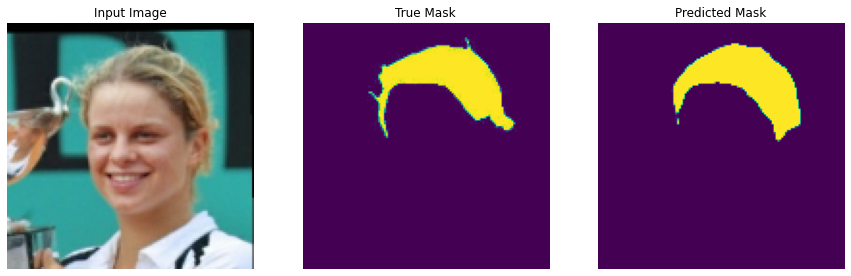


Sample Prediction after epoch 42

50/50 [==============================] - 4s 87ms/step - loss: 0.1125 - mean_io_u_3: 0.8034 - val_loss: 0.1497 - val_mean_io_u_3: 0.7792
Epoch 43/100
50/50 [==============================] - ETA: 0s - loss: 0.1108 - mean_io_u_3: 0.8047
Epoch 00043: val_loss did not improve from 0.14168


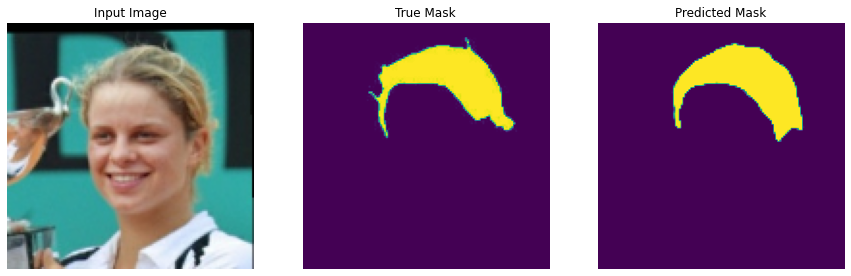


Sample Prediction after epoch 43

50/50 [==============================] - 4s 87ms/step - loss: 0.1108 - mean_io_u_3: 0.8047 - val_loss: 0.1527 - val_mean_io_u_3: 0.7751
Epoch 44/100
50/50 [==============================] - ETA: 0s - loss: 0.1120 - mean_io_u_3: 0.8051
Epoch 00044: val_loss did not improve from 0.14168


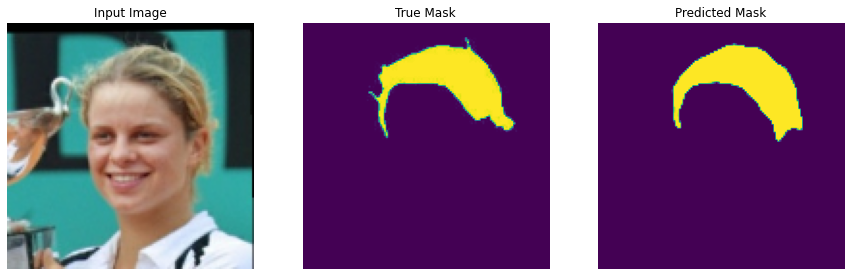


Sample Prediction after epoch 44

50/50 [==============================] - 4s 87ms/step - loss: 0.1120 - mean_io_u_3: 0.8051 - val_loss: 0.1697 - val_mean_io_u_3: 0.7619
Epoch 45/100
50/50 [==============================] - ETA: 0s - loss: 0.1109 - mean_io_u_3: 0.8051
Epoch 00045: val_loss did not improve from 0.14168


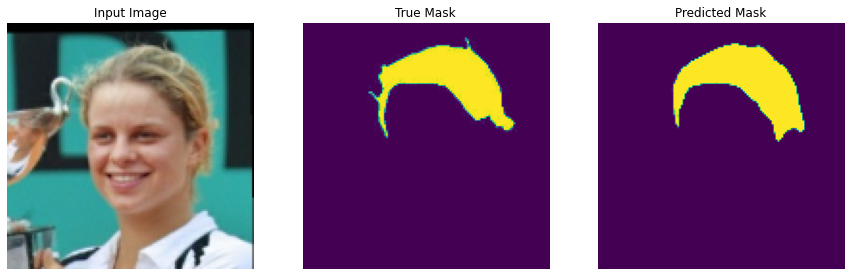


Sample Prediction after epoch 45

50/50 [==============================] - 4s 87ms/step - loss: 0.1109 - mean_io_u_3: 0.8051 - val_loss: 0.1560 - val_mean_io_u_3: 0.7632
Epoch 46/100
50/50 [==============================] - ETA: 0s - loss: 0.1078 - mean_io_u_3: 0.8065
Epoch 00046: val_loss did not improve from 0.14168


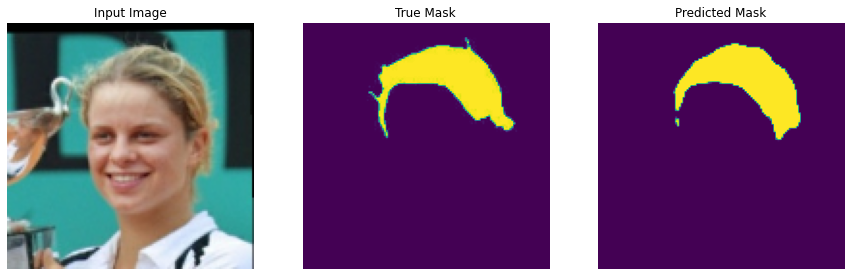


Sample Prediction after epoch 46

50/50 [==============================] - 4s 87ms/step - loss: 0.1078 - mean_io_u_3: 0.8065 - val_loss: 0.1481 - val_mean_io_u_3: 0.7831
Epoch 47/100
50/50 [==============================] - ETA: 0s - loss: 0.1042 - mean_io_u_3: 0.8095
Epoch 00047: val_loss did not improve from 0.14168


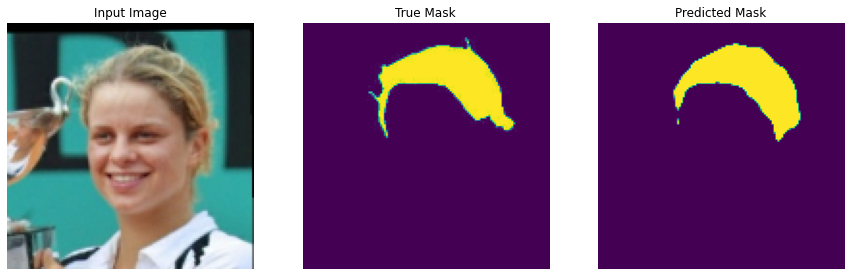


Sample Prediction after epoch 47

50/50 [==============================] - 4s 86ms/step - loss: 0.1042 - mean_io_u_3: 0.8095 - val_loss: 0.1577 - val_mean_io_u_3: 0.7700
Epoch 48/100
50/50 [==============================] - ETA: 0s - loss: 0.1045 - mean_io_u_3: 0.8085
Epoch 00048: val_loss did not improve from 0.14168


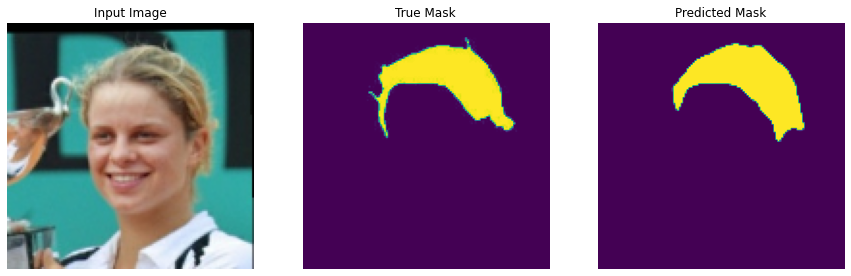


Sample Prediction after epoch 48

50/50 [==============================] - 4s 88ms/step - loss: 0.1045 - mean_io_u_3: 0.8085 - val_loss: 0.1548 - val_mean_io_u_3: 0.7713
Epoch 49/100
50/50 [==============================] - ETA: 0s - loss: 0.1049 - mean_io_u_3: 0.8080
Epoch 00049: val_loss did not improve from 0.14168


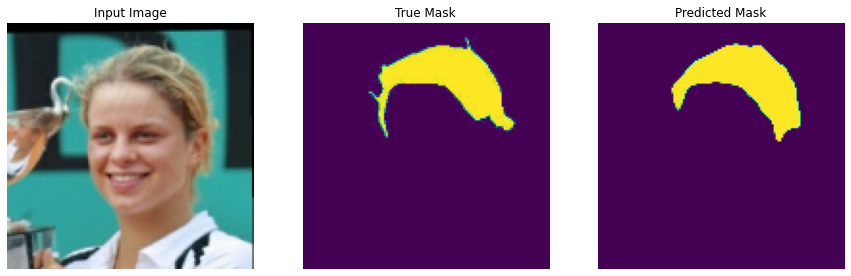


Sample Prediction after epoch 49

50/50 [==============================] - 4s 87ms/step - loss: 0.1049 - mean_io_u_3: 0.8080 - val_loss: 0.1612 - val_mean_io_u_3: 0.7698
Epoch 50/100
50/50 [==============================] - ETA: 0s - loss: 0.1045 - mean_io_u_3: 0.8087
Epoch 00050: val_loss did not improve from 0.14168


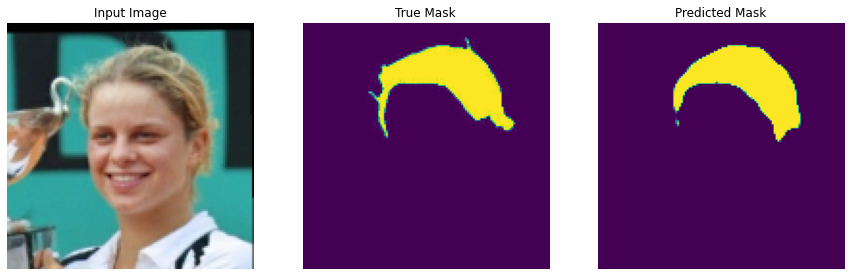


Sample Prediction after epoch 50

50/50 [==============================] - 4s 87ms/step - loss: 0.1045 - mean_io_u_3: 0.8087 - val_loss: 0.1567 - val_mean_io_u_3: 0.7771
Epoch 51/100
50/50 [==============================] - ETA: 0s - loss: 0.1032 - mean_io_u_3: 0.8084
Epoch 00051: val_loss did not improve from 0.14168


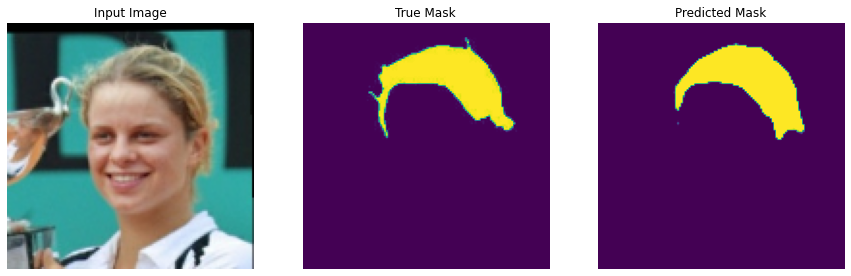


Sample Prediction after epoch 51

50/50 [==============================] - 4s 86ms/step - loss: 0.1032 - mean_io_u_3: 0.8084 - val_loss: 0.1543 - val_mean_io_u_3: 0.7795
Epoch 52/100
50/50 [==============================] - ETA: 0s - loss: 0.0992 - mean_io_u_3: 0.8118
Epoch 00052: val_loss did not improve from 0.14168


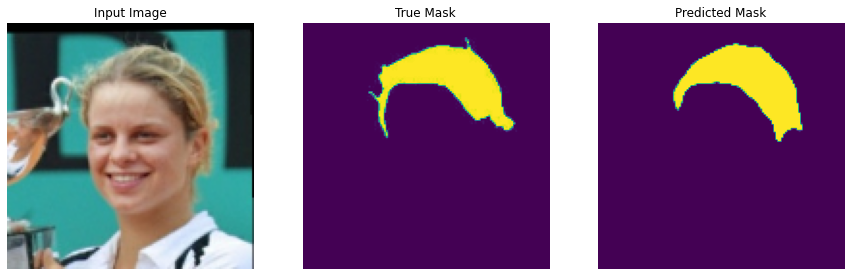


Sample Prediction after epoch 52

50/50 [==============================] - 4s 87ms/step - loss: 0.0992 - mean_io_u_3: 0.8118 - val_loss: 0.1436 - val_mean_io_u_3: 0.7826
Epoch 53/100
50/50 [==============================] - ETA: 0s - loss: 0.0984 - mean_io_u_3: 0.8106
Epoch 00053: val_loss did not improve from 0.14168


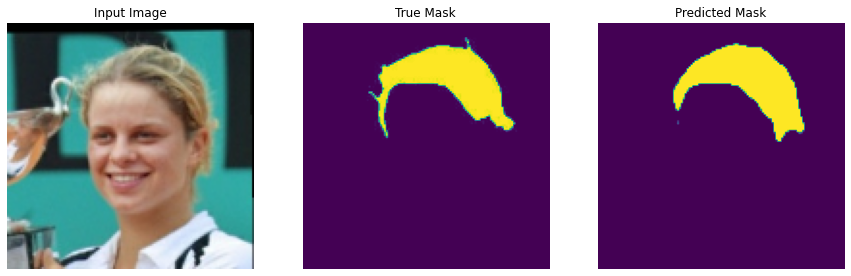


Sample Prediction after epoch 53

50/50 [==============================] - 4s 86ms/step - loss: 0.0984 - mean_io_u_3: 0.8106 - val_loss: 0.1520 - val_mean_io_u_3: 0.7712
Epoch 54/100
50/50 [==============================] - ETA: 0s - loss: 0.0992 - mean_io_u_3: 0.8119
Epoch 00054: val_loss did not improve from 0.14168


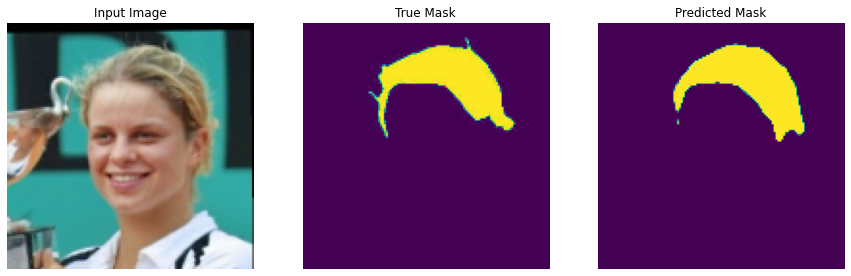


Sample Prediction after epoch 54

50/50 [==============================] - 4s 87ms/step - loss: 0.0992 - mean_io_u_3: 0.8119 - val_loss: 0.1558 - val_mean_io_u_3: 0.7715
Epoch 55/100
50/50 [==============================] - ETA: 0s - loss: 0.0986 - mean_io_u_3: 0.8118
Epoch 00055: val_loss did not improve from 0.14168


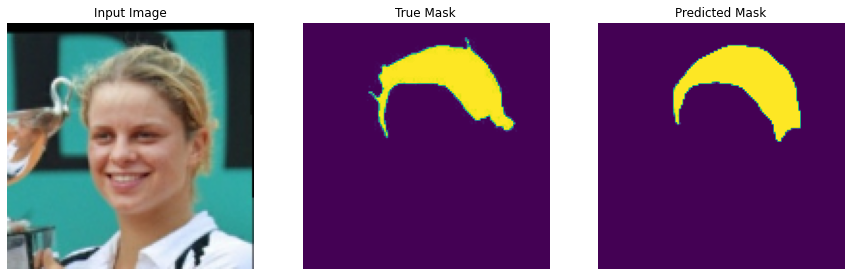


Sample Prediction after epoch 55

50/50 [==============================] - 4s 87ms/step - loss: 0.0986 - mean_io_u_3: 0.8118 - val_loss: 0.1495 - val_mean_io_u_3: 0.7766
Epoch 56/100
50/50 [==============================] - ETA: 0s - loss: 0.0978 - mean_io_u_3: 0.8126
Epoch 00056: val_loss did not improve from 0.14168


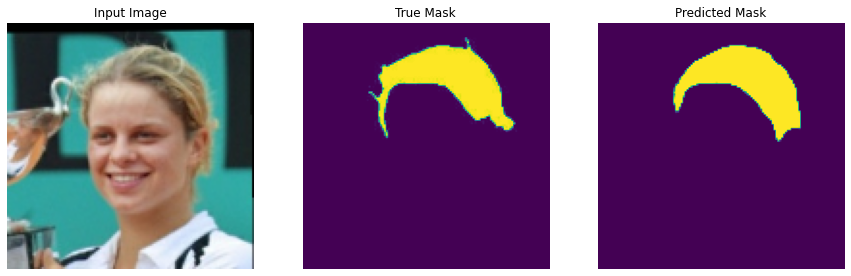


Sample Prediction after epoch 56

50/50 [==============================] - 5s 91ms/step - loss: 0.0978 - mean_io_u_3: 0.8126 - val_loss: 0.1546 - val_mean_io_u_3: 0.7728
Epoch 57/100
50/50 [==============================] - ETA: 0s - loss: 0.0984 - mean_io_u_3: 0.8108
Epoch 00057: val_loss did not improve from 0.14168


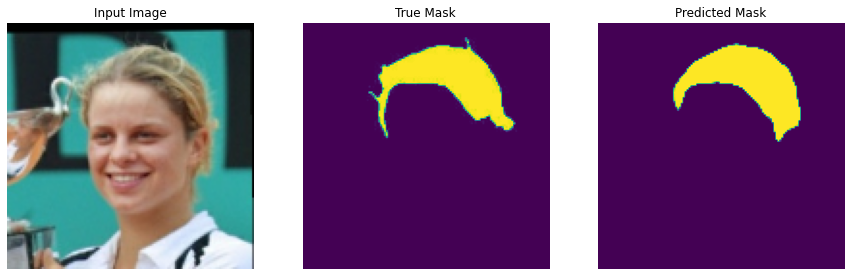


Sample Prediction after epoch 57

50/50 [==============================] - 4s 86ms/step - loss: 0.0984 - mean_io_u_3: 0.8108 - val_loss: 0.1562 - val_mean_io_u_3: 0.7722
Epoch 58/100
50/50 [==============================] - ETA: 0s - loss: 0.0957 - mean_io_u_3: 0.8116
Epoch 00058: val_loss did not improve from 0.14168


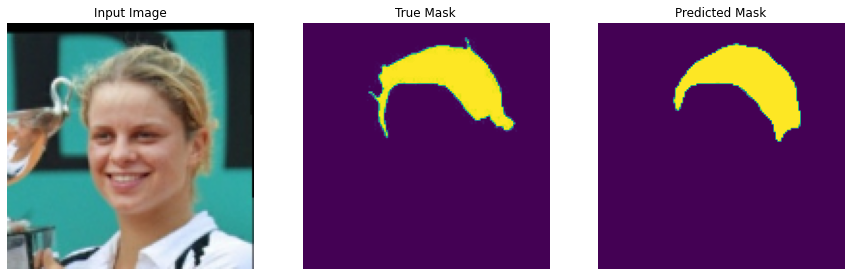


Sample Prediction after epoch 58

50/50 [==============================] - 4s 87ms/step - loss: 0.0957 - mean_io_u_3: 0.8116 - val_loss: 0.1509 - val_mean_io_u_3: 0.7791
Epoch 59/100
50/50 [==============================] - ETA: 0s - loss: 0.0961 - mean_io_u_3: 0.8119
Epoch 00059: val_loss did not improve from 0.14168


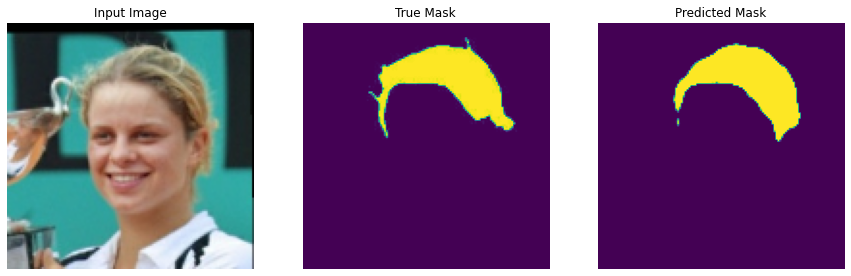


Sample Prediction after epoch 59

50/50 [==============================] - 4s 88ms/step - loss: 0.0961 - mean_io_u_3: 0.8119 - val_loss: 0.1594 - val_mean_io_u_3: 0.7733
Epoch 60/100
50/50 [==============================] - ETA: 0s - loss: 0.0971 - mean_io_u_3: 0.8111
Epoch 00060: val_loss did not improve from 0.14168


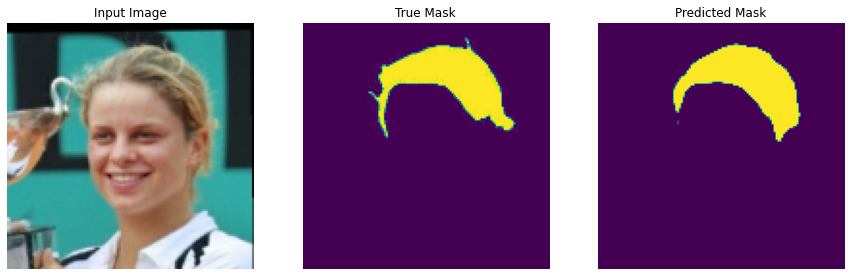


Sample Prediction after epoch 60

50/50 [==============================] - 4s 86ms/step - loss: 0.0971 - mean_io_u_3: 0.8111 - val_loss: 0.1475 - val_mean_io_u_3: 0.7787
Epoch 61/100
50/50 [==============================] - ETA: 0s - loss: 0.0962 - mean_io_u_3: 0.8107
Epoch 00061: val_loss did not improve from 0.14168


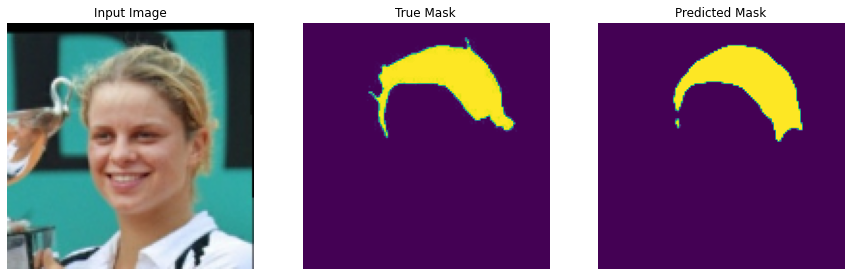


Sample Prediction after epoch 61

50/50 [==============================] - 4s 87ms/step - loss: 0.0962 - mean_io_u_3: 0.8107 - val_loss: 0.1490 - val_mean_io_u_3: 0.7821
Epoch 62/100
50/50 [==============================] - ETA: 0s - loss: 0.0950 - mean_io_u_3: 0.8117
Epoch 00062: val_loss did not improve from 0.14168


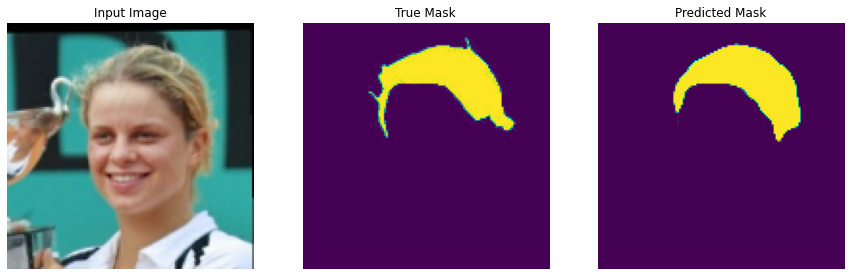


Sample Prediction after epoch 62

50/50 [==============================] - 4s 87ms/step - loss: 0.0950 - mean_io_u_3: 0.8117 - val_loss: 0.1473 - val_mean_io_u_3: 0.7732
Epoch 63/100
50/50 [==============================] - ETA: 0s - loss: 0.0986 - mean_io_u_3: 0.8094
Epoch 00063: val_loss did not improve from 0.14168


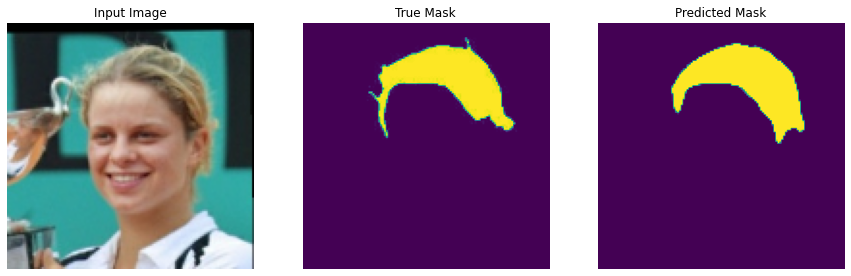


Sample Prediction after epoch 63

50/50 [==============================] - 4s 87ms/step - loss: 0.0986 - mean_io_u_3: 0.8094 - val_loss: 0.1466 - val_mean_io_u_3: 0.7711
Epoch 64/100
50/50 [==============================] - ETA: 0s - loss: 0.0987 - mean_io_u_3: 0.8121
Epoch 00064: val_loss improved from 0.14168 to 0.13795, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


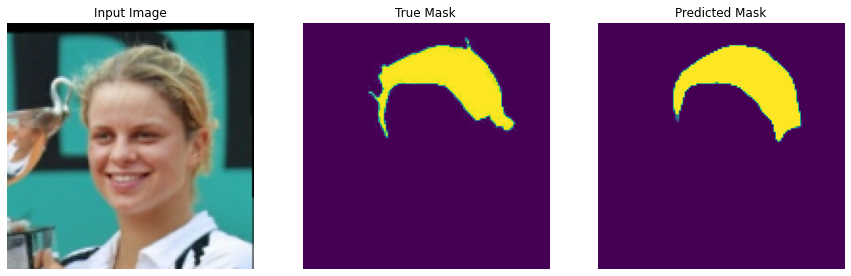


Sample Prediction after epoch 64

50/50 [==============================] - 8s 151ms/step - loss: 0.0987 - mean_io_u_3: 0.8121 - val_loss: 0.1380 - val_mean_io_u_3: 0.7815
Epoch 65/100
50/50 [==============================] - ETA: 0s - loss: 0.0976 - mean_io_u_3: 0.8106
Epoch 00065: val_loss did not improve from 0.13795


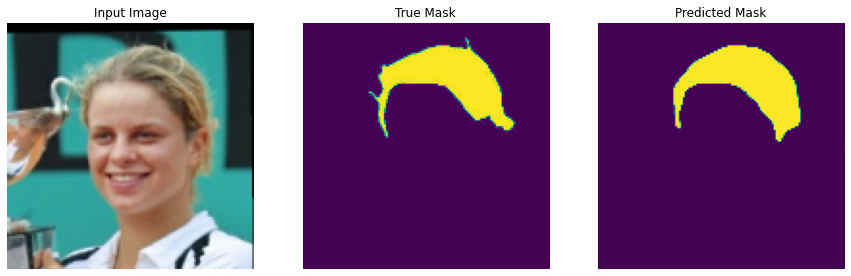


Sample Prediction after epoch 65

50/50 [==============================] - 4s 88ms/step - loss: 0.0976 - mean_io_u_3: 0.8106 - val_loss: 0.1457 - val_mean_io_u_3: 0.7746
Epoch 66/100
50/50 [==============================] - ETA: 0s - loss: 0.0998 - mean_io_u_3: 0.8074
Epoch 00066: val_loss did not improve from 0.13795


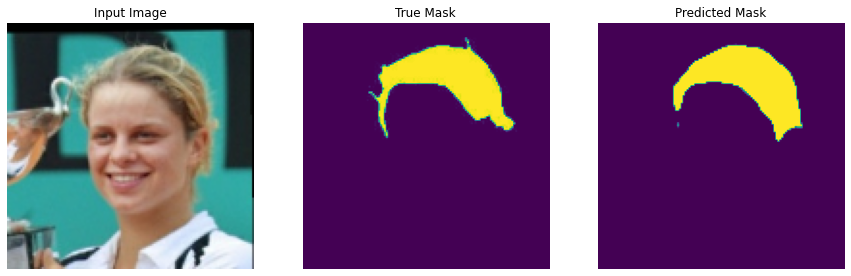


Sample Prediction after epoch 66

50/50 [==============================] - 4s 87ms/step - loss: 0.0998 - mean_io_u_3: 0.8074 - val_loss: 0.1596 - val_mean_io_u_3: 0.7737
Epoch 67/100
50/50 [==============================] - ETA: 0s - loss: 0.1034 - mean_io_u_3: 0.8070
Epoch 00067: val_loss did not improve from 0.13795


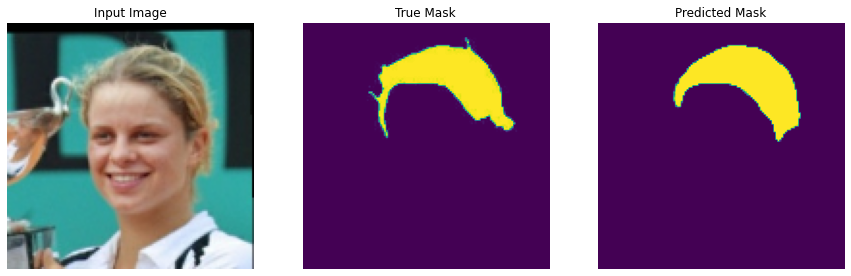


Sample Prediction after epoch 67

50/50 [==============================] - 4s 88ms/step - loss: 0.1034 - mean_io_u_3: 0.8070 - val_loss: 0.1470 - val_mean_io_u_3: 0.7833
Epoch 68/100
50/50 [==============================] - ETA: 0s - loss: 0.1033 - mean_io_u_3: 0.8046
Epoch 00068: val_loss did not improve from 0.13795


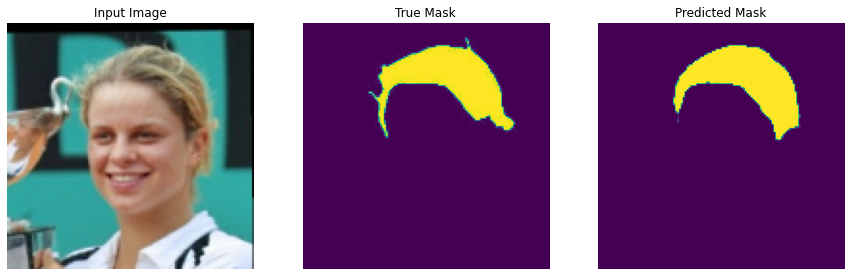


Sample Prediction after epoch 68

50/50 [==============================] - 4s 87ms/step - loss: 0.1033 - mean_io_u_3: 0.8046 - val_loss: 0.1468 - val_mean_io_u_3: 0.7802
Epoch 69/100
50/50 [==============================] - ETA: 0s - loss: 0.1014 - mean_io_u_3: 0.8082
Epoch 00069: val_loss did not improve from 0.13795


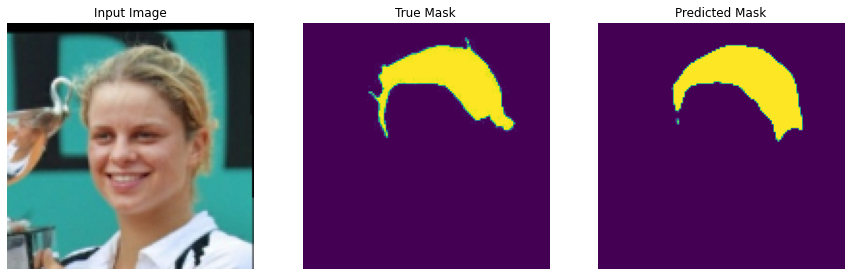


Sample Prediction after epoch 69

50/50 [==============================] - 4s 87ms/step - loss: 0.1014 - mean_io_u_3: 0.8082 - val_loss: 0.1430 - val_mean_io_u_3: 0.7754
Epoch 70/100
50/50 [==============================] - ETA: 0s - loss: 0.1006 - mean_io_u_3: 0.8071
Epoch 00070: val_loss did not improve from 0.13795


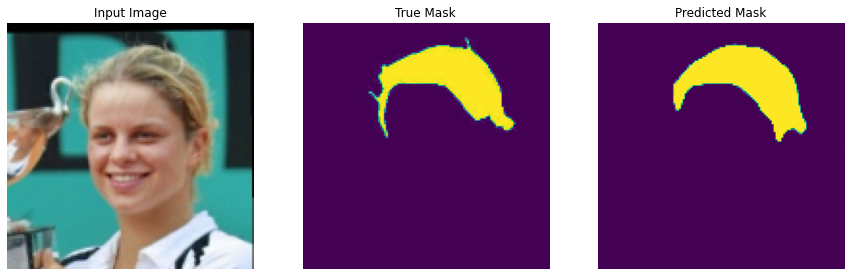


Sample Prediction after epoch 70

50/50 [==============================] - 4s 87ms/step - loss: 0.1006 - mean_io_u_3: 0.8071 - val_loss: 0.1463 - val_mean_io_u_3: 0.7755
Epoch 71/100
50/50 [==============================] - ETA: 0s - loss: 0.1088 - mean_io_u_3: 0.8030
Epoch 00071: val_loss improved from 0.13795 to 0.13640, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


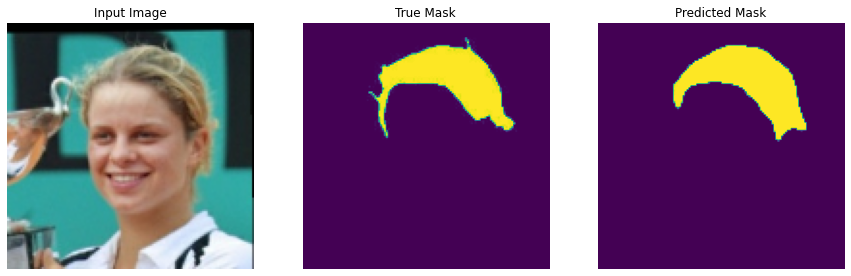


Sample Prediction after epoch 71

50/50 [==============================] - 8s 154ms/step - loss: 0.1088 - mean_io_u_3: 0.8030 - val_loss: 0.1364 - val_mean_io_u_3: 0.7878
Epoch 72/100
50/50 [==============================] - ETA: 0s - loss: 0.1019 - mean_io_u_3: 0.8062
Epoch 00072: val_loss did not improve from 0.13640


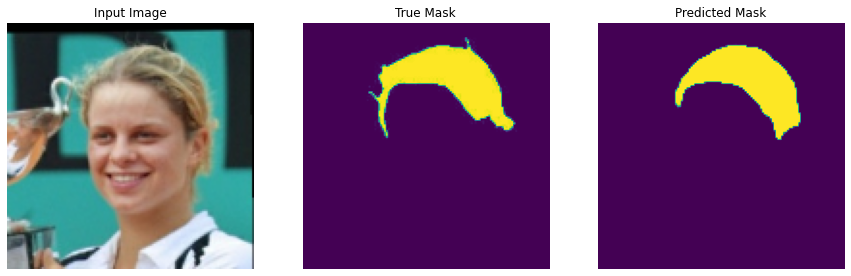


Sample Prediction after epoch 72

50/50 [==============================] - 4s 88ms/step - loss: 0.1019 - mean_io_u_3: 0.8062 - val_loss: 0.1491 - val_mean_io_u_3: 0.7779
Epoch 73/100
50/50 [==============================] - ETA: 0s - loss: 0.0981 - mean_io_u_3: 0.8071
Epoch 00073: val_loss did not improve from 0.13640


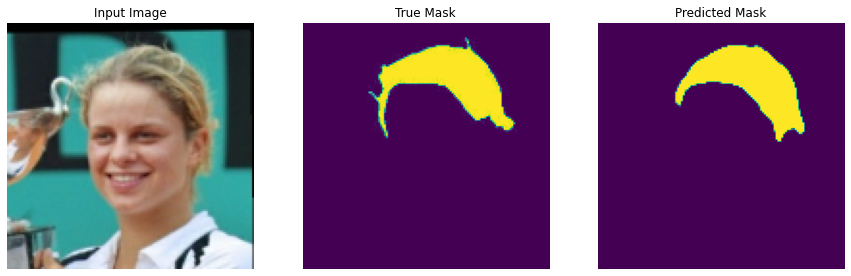


Sample Prediction after epoch 73

50/50 [==============================] - 4s 88ms/step - loss: 0.0981 - mean_io_u_3: 0.8071 - val_loss: 0.1373 - val_mean_io_u_3: 0.7867
Epoch 74/100
50/50 [==============================] - ETA: 0s - loss: 0.0944 - mean_io_u_3: 0.8112
Epoch 00074: val_loss improved from 0.13640 to 0.13548, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


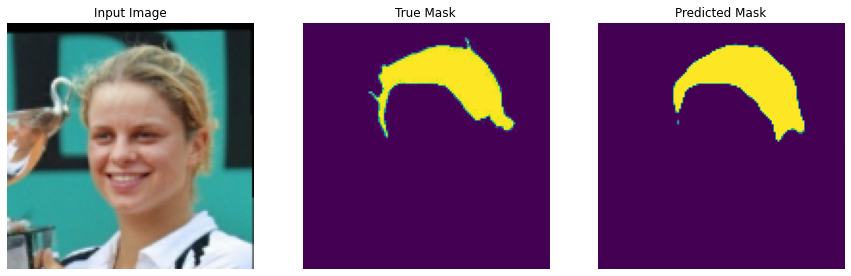


Sample Prediction after epoch 74

50/50 [==============================] - 8s 155ms/step - loss: 0.0944 - mean_io_u_3: 0.8112 - val_loss: 0.1355 - val_mean_io_u_3: 0.7764
Epoch 75/100
50/50 [==============================] - ETA: 0s - loss: 0.0951 - mean_io_u_3: 0.8085
Epoch 00075: val_loss did not improve from 0.13548


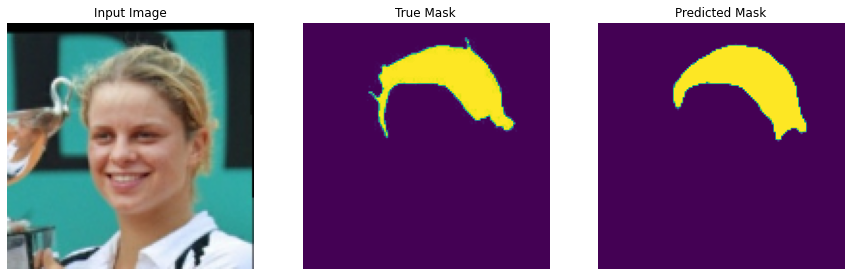


Sample Prediction after epoch 75

50/50 [==============================] - 4s 88ms/step - loss: 0.0951 - mean_io_u_3: 0.8085 - val_loss: 0.1587 - val_mean_io_u_3: 0.7662
Epoch 76/100
50/50 [==============================] - ETA: 0s - loss: 0.0992 - mean_io_u_3: 0.8060
Epoch 00076: val_loss did not improve from 0.13548


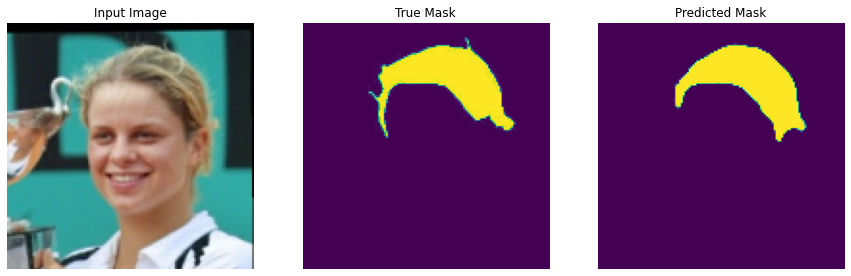


Sample Prediction after epoch 76

50/50 [==============================] - 4s 86ms/step - loss: 0.0992 - mean_io_u_3: 0.8060 - val_loss: 0.1574 - val_mean_io_u_3: 0.7687
Epoch 77/100
50/50 [==============================] - ETA: 0s - loss: 0.0940 - mean_io_u_3: 0.8079
Epoch 00077: val_loss did not improve from 0.13548


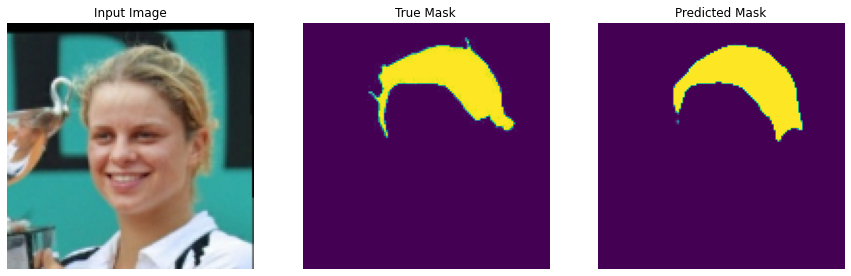


Sample Prediction after epoch 77

50/50 [==============================] - 4s 87ms/step - loss: 0.0940 - mean_io_u_3: 0.8079 - val_loss: 0.1441 - val_mean_io_u_3: 0.7762
Epoch 78/100
50/50 [==============================] - ETA: 0s - loss: 0.0918 - mean_io_u_3: 0.8109
Epoch 00078: val_loss did not improve from 0.13548


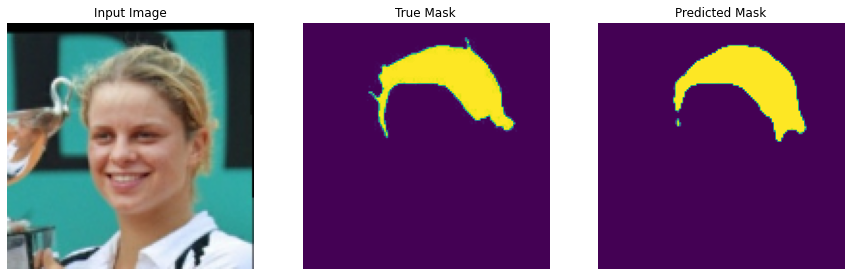


Sample Prediction after epoch 78

50/50 [==============================] - 4s 88ms/step - loss: 0.0918 - mean_io_u_3: 0.8109 - val_loss: 0.1376 - val_mean_io_u_3: 0.7775
Epoch 79/100
50/50 [==============================] - ETA: 0s - loss: 0.0941 - mean_io_u_3: 0.8090
Epoch 00079: val_loss did not improve from 0.13548


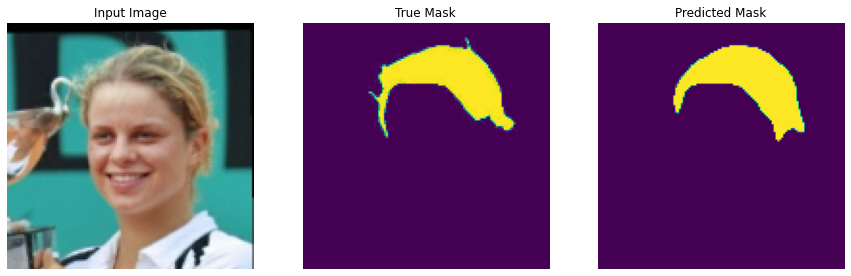


Sample Prediction after epoch 79

50/50 [==============================] - 4s 87ms/step - loss: 0.0941 - mean_io_u_3: 0.8090 - val_loss: 0.1505 - val_mean_io_u_3: 0.7765
Epoch 80/100
50/50 [==============================] - ETA: 0s - loss: 0.0900 - mean_io_u_3: 0.8124
Epoch 00080: val_loss improved from 0.13548 to 0.13312, saving model to drive/MyDrive/DeepParekh_Assignment3/best_model_unet
INFO:tensorflow:Assets written to: drive/MyDrive/DeepParekh_Assignment3/best_model_unet/assets


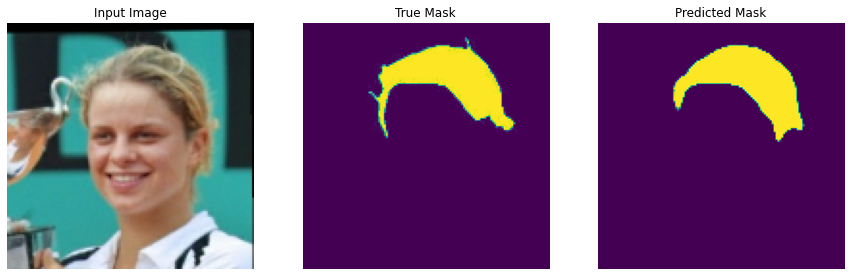


Sample Prediction after epoch 80

50/50 [==============================] - 8s 153ms/step - loss: 0.0900 - mean_io_u_3: 0.8124 - val_loss: 0.1331 - val_mean_io_u_3: 0.7843
Epoch 81/100
50/50 [==============================] - ETA: 0s - loss: 0.0887 - mean_io_u_3: 0.8124
Epoch 00081: val_loss did not improve from 0.13312


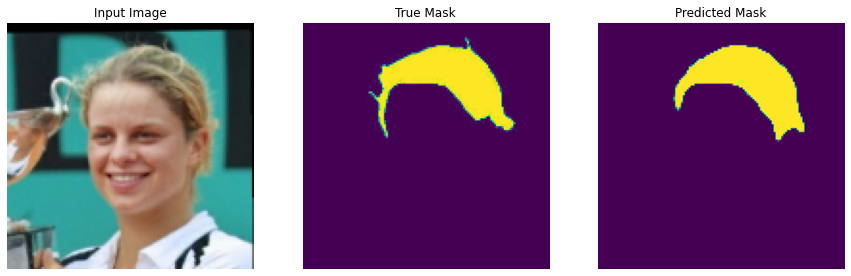


Sample Prediction after epoch 81

50/50 [==============================] - 4s 88ms/step - loss: 0.0887 - mean_io_u_3: 0.8124 - val_loss: 0.1353 - val_mean_io_u_3: 0.7837
Epoch 82/100
50/50 [==============================] - ETA: 0s - loss: 0.0883 - mean_io_u_3: 0.8125
Epoch 00082: val_loss did not improve from 0.13312


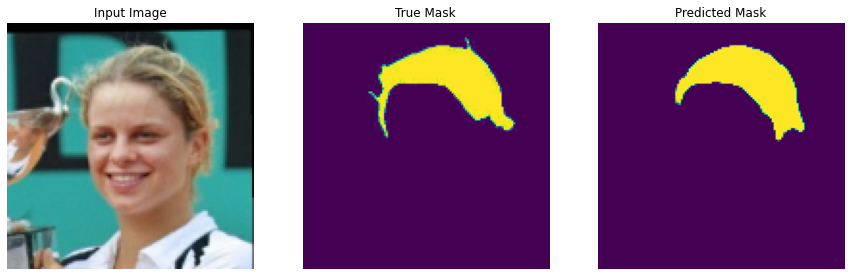


Sample Prediction after epoch 82

50/50 [==============================] - 4s 87ms/step - loss: 0.0883 - mean_io_u_3: 0.8125 - val_loss: 0.1406 - val_mean_io_u_3: 0.7873
Epoch 83/100
50/50 [==============================] - ETA: 0s - loss: 0.0883 - mean_io_u_3: 0.8130
Epoch 00083: val_loss did not improve from 0.13312


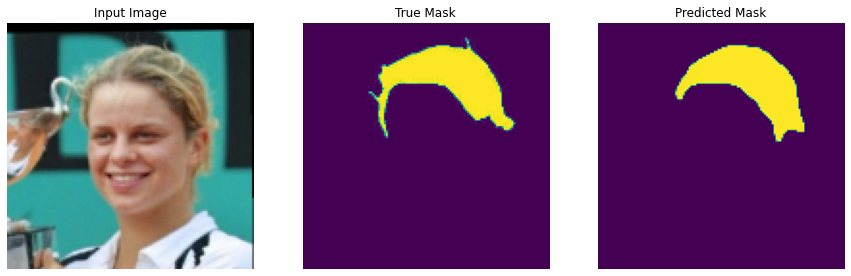


Sample Prediction after epoch 83

50/50 [==============================] - 5s 92ms/step - loss: 0.0883 - mean_io_u_3: 0.8130 - val_loss: 0.1487 - val_mean_io_u_3: 0.7669
Epoch 84/100
50/50 [==============================] - ETA: 0s - loss: 0.0892 - mean_io_u_3: 0.8125
Epoch 00084: val_loss did not improve from 0.13312


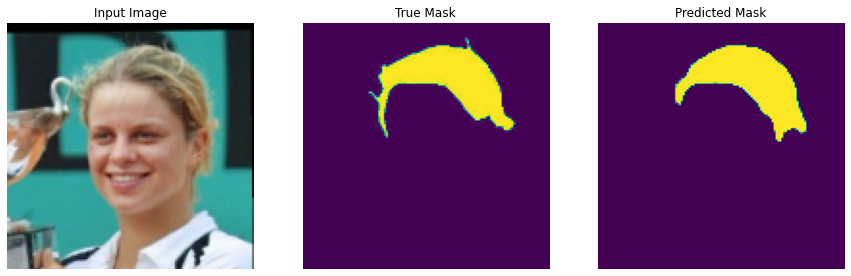


Sample Prediction after epoch 84

50/50 [==============================] - 4s 87ms/step - loss: 0.0892 - mean_io_u_3: 0.8125 - val_loss: 0.1361 - val_mean_io_u_3: 0.7870
Epoch 85/100
50/50 [==============================] - ETA: 0s - loss: 0.0849 - mean_io_u_3: 0.8157
Epoch 00085: val_loss did not improve from 0.13312


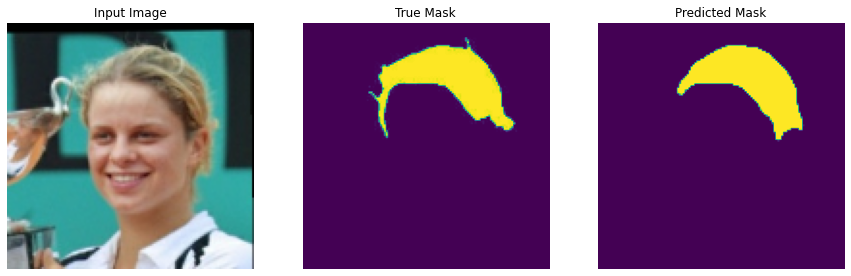


Sample Prediction after epoch 85

50/50 [==============================] - 4s 86ms/step - loss: 0.0849 - mean_io_u_3: 0.8157 - val_loss: 0.1396 - val_mean_io_u_3: 0.7869
Epoch 86/100
50/50 [==============================] - ETA: 0s - loss: 0.0853 - mean_io_u_3: 0.8143
Epoch 00086: val_loss did not improve from 0.13312


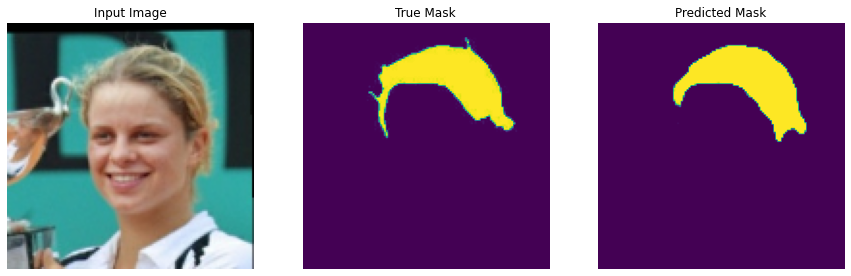


Sample Prediction after epoch 86

50/50 [==============================] - 4s 87ms/step - loss: 0.0853 - mean_io_u_3: 0.8143 - val_loss: 0.1373 - val_mean_io_u_3: 0.7836
Epoch 87/100
50/50 [==============================] - ETA: 0s - loss: 0.0855 - mean_io_u_3: 0.8145
Epoch 00087: val_loss did not improve from 0.13312


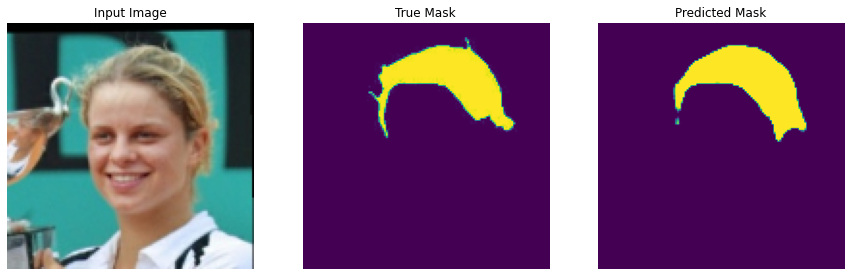


Sample Prediction after epoch 87

50/50 [==============================] - 4s 87ms/step - loss: 0.0855 - mean_io_u_3: 0.8145 - val_loss: 0.1457 - val_mean_io_u_3: 0.7724
Epoch 88/100
50/50 [==============================] - ETA: 0s - loss: 0.0873 - mean_io_u_3: 0.8130
Epoch 00088: val_loss did not improve from 0.13312


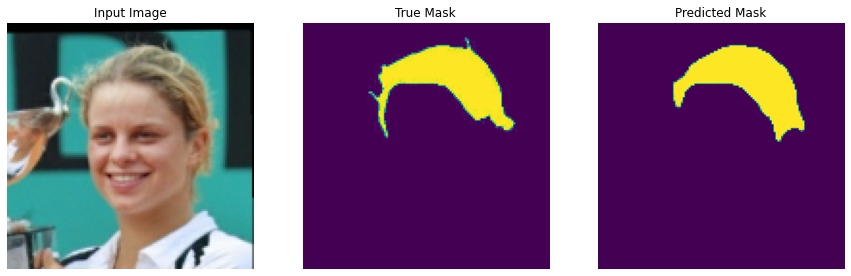


Sample Prediction after epoch 88

50/50 [==============================] - 4s 87ms/step - loss: 0.0873 - mean_io_u_3: 0.8130 - val_loss: 0.1397 - val_mean_io_u_3: 0.7886
Epoch 89/100
50/50 [==============================] - ETA: 0s - loss: 0.0834 - mean_io_u_3: 0.8153
Epoch 00089: val_loss did not improve from 0.13312


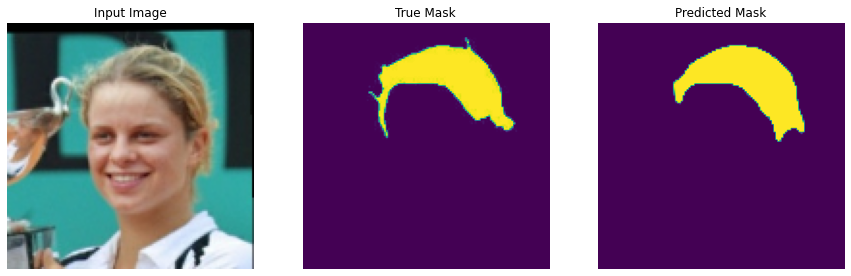


Sample Prediction after epoch 89

50/50 [==============================] - 4s 87ms/step - loss: 0.0834 - mean_io_u_3: 0.8153 - val_loss: 0.1406 - val_mean_io_u_3: 0.7732
Epoch 90/100
50/50 [==============================] - ETA: 0s - loss: 0.0831 - mean_io_u_3: 0.8143
Epoch 00090: val_loss did not improve from 0.13312


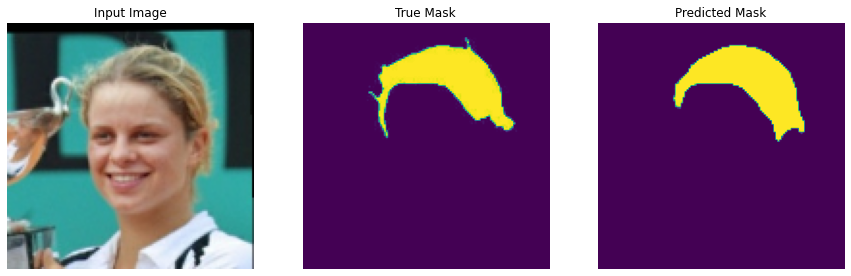


Sample Prediction after epoch 90

50/50 [==============================] - 4s 87ms/step - loss: 0.0831 - mean_io_u_3: 0.8143 - val_loss: 0.1497 - val_mean_io_u_3: 0.7689
Epoch 91/100
50/50 [==============================] - ETA: 0s - loss: 0.0838 - mean_io_u_3: 0.8145
Epoch 00091: val_loss did not improve from 0.13312


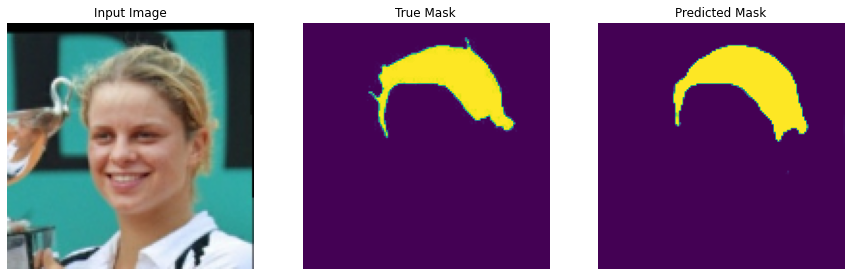


Sample Prediction after epoch 91

50/50 [==============================] - 4s 87ms/step - loss: 0.0838 - mean_io_u_3: 0.8145 - val_loss: 0.1555 - val_mean_io_u_3: 0.7637
Epoch 92/100
50/50 [==============================] - ETA: 0s - loss: 0.0839 - mean_io_u_3: 0.8148
Epoch 00092: val_loss did not improve from 0.13312


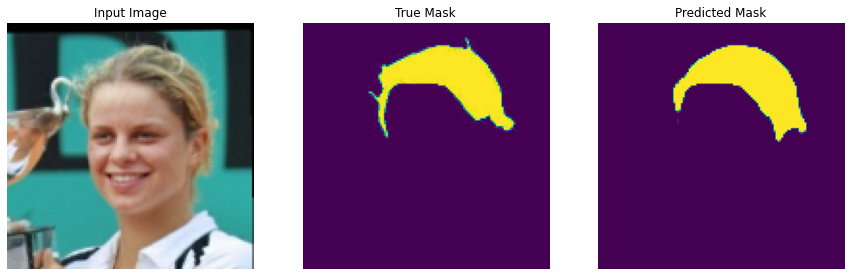


Sample Prediction after epoch 92

50/50 [==============================] - 4s 87ms/step - loss: 0.0839 - mean_io_u_3: 0.8148 - val_loss: 0.1409 - val_mean_io_u_3: 0.7776
Epoch 93/100
50/50 [==============================] - ETA: 0s - loss: 0.0861 - mean_io_u_3: 0.8125
Epoch 00093: val_loss did not improve from 0.13312


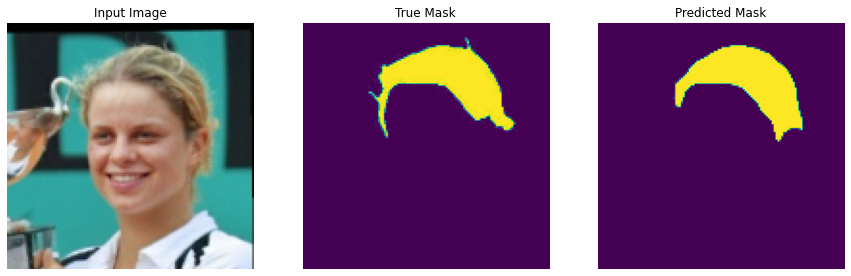


Sample Prediction after epoch 93

50/50 [==============================] - 4s 87ms/step - loss: 0.0861 - mean_io_u_3: 0.8125 - val_loss: 0.1483 - val_mean_io_u_3: 0.7760
Epoch 94/100
50/50 [==============================] - ETA: 0s - loss: 0.0850 - mean_io_u_3: 0.8126
Epoch 00094: val_loss did not improve from 0.13312


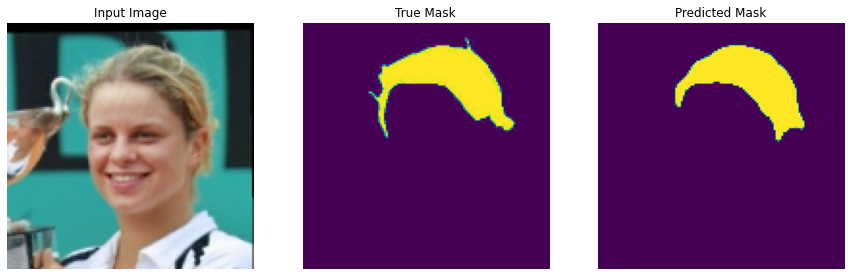


Sample Prediction after epoch 94

50/50 [==============================] - 4s 87ms/step - loss: 0.0850 - mean_io_u_3: 0.8126 - val_loss: 0.1433 - val_mean_io_u_3: 0.7808
Epoch 95/100
50/50 [==============================] - ETA: 0s - loss: 0.0859 - mean_io_u_3: 0.8128
Epoch 00095: val_loss did not improve from 0.13312


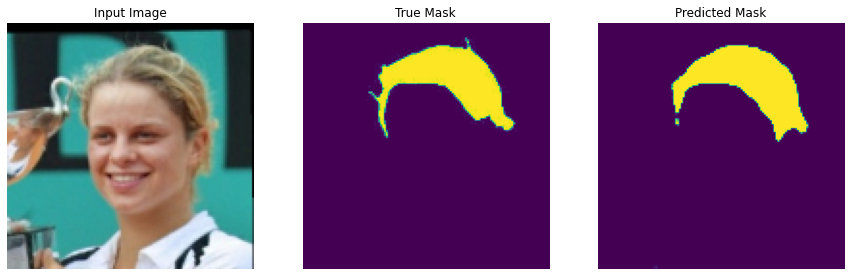


Sample Prediction after epoch 95

50/50 [==============================] - 4s 87ms/step - loss: 0.0859 - mean_io_u_3: 0.8128 - val_loss: 0.1367 - val_mean_io_u_3: 0.7708
Epoch 96/100
50/50 [==============================] - ETA: 0s - loss: 0.0868 - mean_io_u_3: 0.8112
Epoch 00096: val_loss did not improve from 0.13312


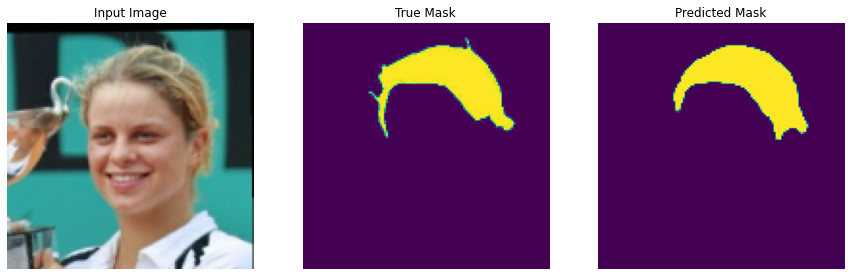


Sample Prediction after epoch 96

50/50 [==============================] - 4s 86ms/step - loss: 0.0868 - mean_io_u_3: 0.8112 - val_loss: 0.1513 - val_mean_io_u_3: 0.7700
Epoch 97/100
50/50 [==============================] - ETA: 0s - loss: 0.0869 - mean_io_u_3: 0.8119
Epoch 00097: val_loss did not improve from 0.13312


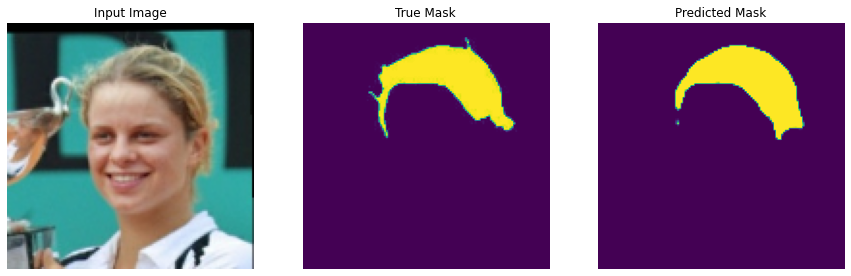


Sample Prediction after epoch 97

50/50 [==============================] - 4s 86ms/step - loss: 0.0869 - mean_io_u_3: 0.8119 - val_loss: 0.1470 - val_mean_io_u_3: 0.7802
Epoch 98/100
50/50 [==============================] - ETA: 0s - loss: 0.0860 - mean_io_u_3: 0.8101
Epoch 00098: val_loss did not improve from 0.13312


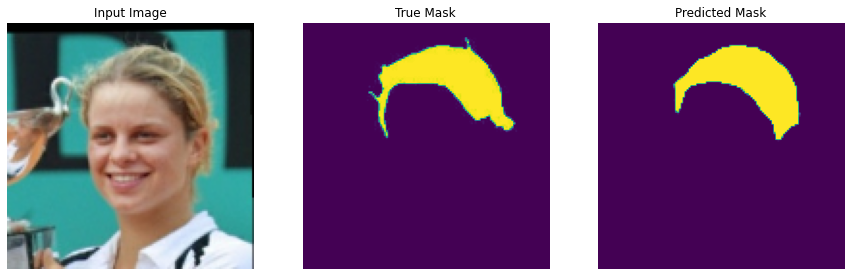


Sample Prediction after epoch 98

50/50 [==============================] - 5s 91ms/step - loss: 0.0860 - mean_io_u_3: 0.8101 - val_loss: 0.1533 - val_mean_io_u_3: 0.7736
Epoch 99/100
50/50 [==============================] - ETA: 0s - loss: 0.0918 - mean_io_u_3: 0.8082
Epoch 00099: val_loss did not improve from 0.13312


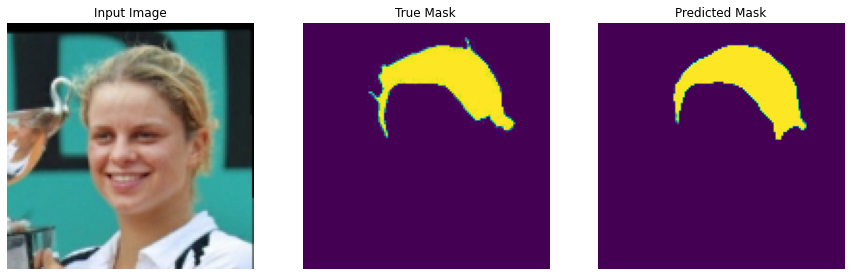


Sample Prediction after epoch 99

50/50 [==============================] - 4s 87ms/step - loss: 0.0918 - mean_io_u_3: 0.8082 - val_loss: 0.1557 - val_mean_io_u_3: 0.7684
Epoch 100/100
50/50 [==============================] - ETA: 0s - loss: 0.0941 - mean_io_u_3: 0.8064
Epoch 00100: val_loss did not improve from 0.13312


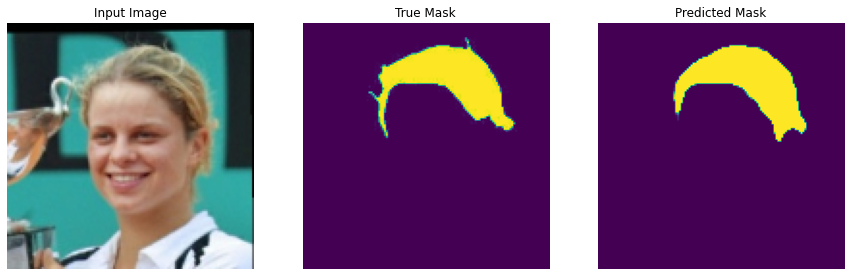


Sample Prediction after epoch 100

50/50 [==============================] - 4s 87ms/step - loss: 0.0941 - mean_io_u_3: 0.8064 - val_loss: 0.1513 - val_mean_io_u_3: 0.7702


In [45]:
EPOCHS=100
VAL_SUBSPLITS=5
STEPS_EPOCH=TRAIN_SIZE//BATCH_SIZE
VAL_STEPS=VALID_SIZE//BATCH_SIZE//VAL_SUBSPLITS

callbacks = [
    #tf.keras.callbacks.EarlyStopping(patience=25, verbose=1),
    tf.keras.callbacks.ModelCheckpoint('drive/MyDrive/DeepParekh_Assignment3/best_model_unet', verbose=1, save_best_only=True),
    #tf.keras.callbacks.ReduceLROnPlateau(patience=15),
    DisplayCallback()
]

'''
print(STEPS_EPOCH)
print(VAL_STEPS)
'''

history = model.fit(train_dataset_batch, 
                    epochs=EPOCHS,
                    steps_per_epoch=STEPS_EPOCH,
                    validation_steps=VAL_STEPS,
                    validation_data=valid_dataset_batch,
                    callbacks=callbacks)

# Learning Curves

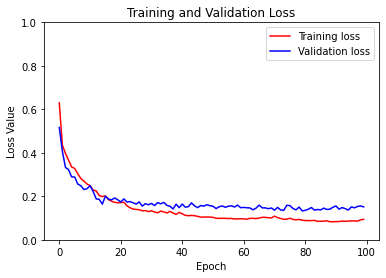

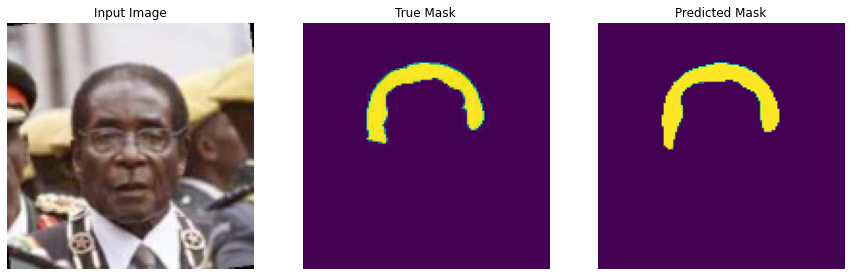

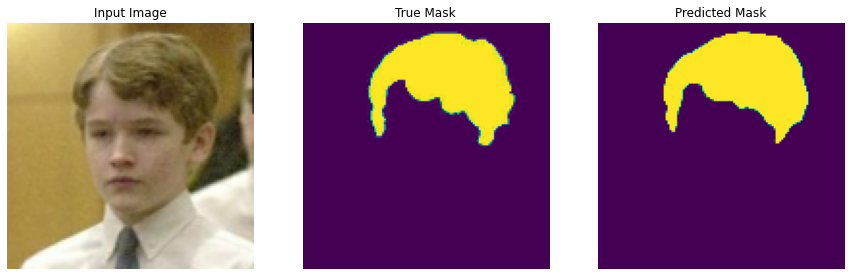

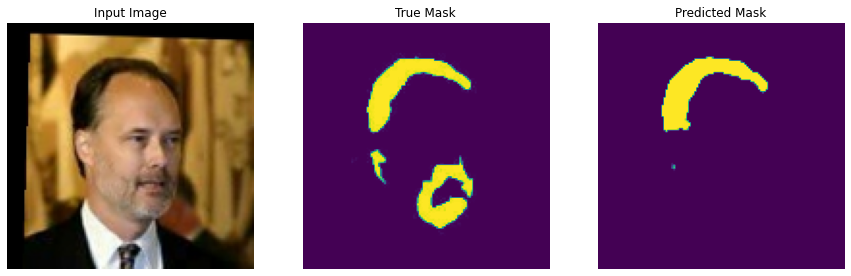

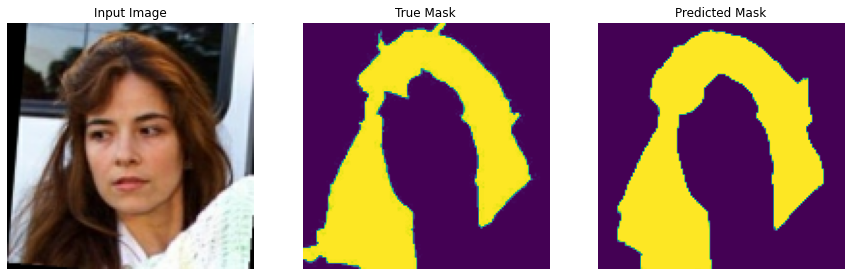

...

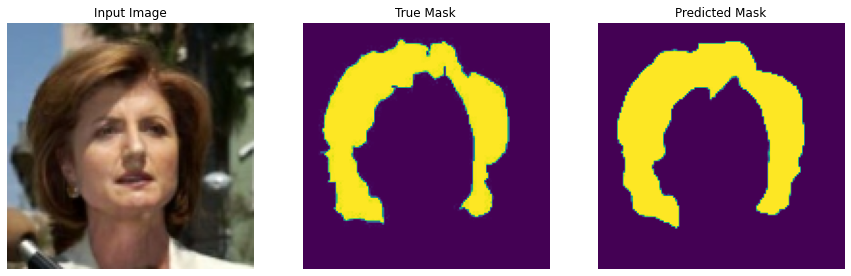

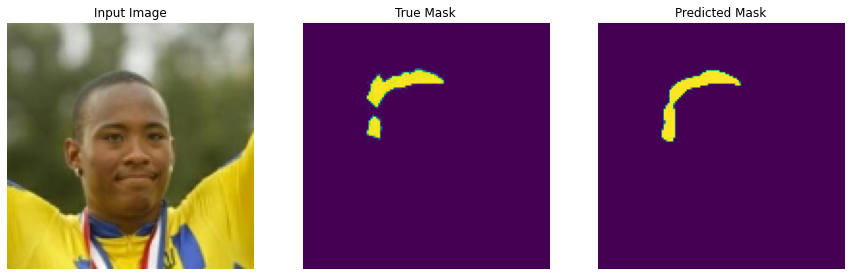

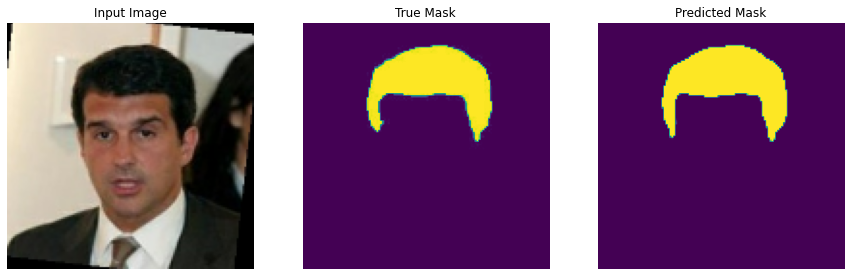

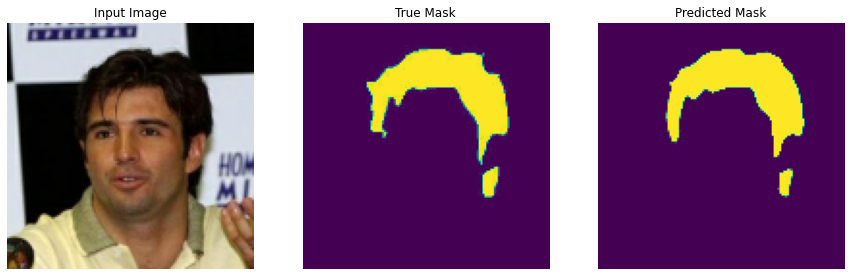

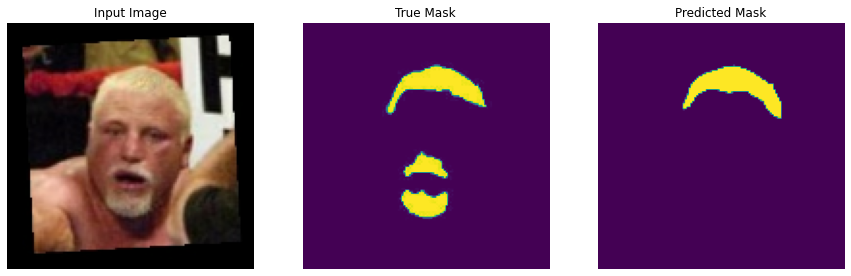

In [46]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

# Show predictions
show_predictions(train_dataset_batch, 10)

In [47]:

#model = tf.keras.models.load_model('drive/MyDrive/DeepParekh_Assignment3/best_model_unet_dice_d_aug_iou', compile=False)

PRED_MASK_PATH = 'drive/MyDrive/DeepParekh_Assignment3/pred_masks/test_mask_'
TEST_IMG_PATH = 'drive/MyDrive/DeepParekh_Assignment3/testing_images/test_img_'
THRESHOLD = 0.5

for i in range(TEST_SIZE):
  ext = str(i+1) + '.jpg'
  img_path = str(TEST_IMG_PATH + ext)
  mask_path = str(PRED_MASK_PATH + ext)
  #print('Image Path: ' + img_path)
  #print('Mask Path: ' + mask_path)
  image_content = tf.io.read_file(img_path)
  image = tf.image.decode_jpeg(image_content, channels=3)
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  image = tf.cast(image, tf.float32) / 255.0
  image = tf.expand_dims(image, axis=0)
  #print(image.shape)
  img = image.numpy()
  mask = model.predict(image)
  mask = np.where(np.array(mask) > THRESHOLD, 1., 0.)
  mask.resize((IMG_SIZE,IMG_SIZE,1))
  #display([img[0], mask])
  mask = mask.astype(np.uint8)
  #display([img[0], mask])
  mask = mask.reshape((IMG_SIZE,IMG_SIZE))
  pred_img = Image.fromarray(mask * 255)
  pred_img = pred_img.resize((250,250))
  #print(pred_img.size)
  pred_img = pred_img.convert('L')
  pred_img.save(mask_path, 'JPEG')
  print('Predicted image ' + str(i+1) + ' from test set')


Predicted image 1 from test set
Predicted image 2 from test set
Predicted image 3 from test set
Predicted image 4 from test set
Predicted image 5 from test set
Predicted image 6 from test set
Predicted image 7 from test set
Predicted image 8 from test set
Predicted image 9 from test set
Predicted image 10 from test set
Predicted image 11 from test set
Predicted image 12 from test set
Predicted image 13 from test set
Predicted image 14 from test set
Predicted image 15 from test set
Predicted image 16 from test set
Predicted image 17 from test set
Predicted image 18 from test set
Predicted image 19 from test set
Predicted image 20 from test set
Predicted image 21 from test set
Predicted image 22 from test set
Predicted image 23 from test set
Predicted image 24 from test set
Predicted image 25 from test set
Predicted image 26 from test set
Predicted image 27 from test set
Predicted image 28 from test set
Predicted image 29 from test set
Predicted image 30 from test set
Predicted image 31 